In [13]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


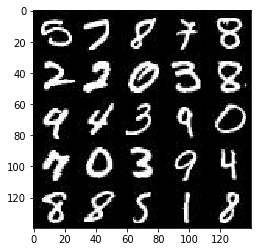

In [14]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

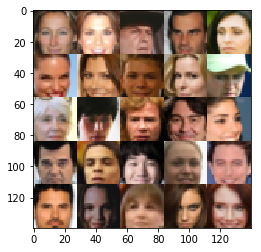

In [15]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

In [16]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.1.0
Default GPU Device: /gpu:0


In [17]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function

    inputs_real = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels), name='input_real') 
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    learning_rate = tf.placeholder(tf.float32, (None), name='learning_rate')
    
    return inputs_real, inputs_z, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


In [18]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 32x32x3
        x1 = tf.layers.conv2d(images, 128, 5, strides=2, padding='same')
        relu1 = tf.maximum(0.2 * x1, x1)
        # 16x16x64
        
        x2 = tf.layers.conv2d(relu1, 256, 5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(0.2 * bn2, bn2)
        # 8x8x128
        
        x3 = tf.layers.conv2d(relu2, 512, 5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(0.2 * bn3, bn3)
        # 4x4x256

        # Flatten it
        flat = tf.reshape(relu3, (-1, 4*4*512))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)

    return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


In [19]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    with tf.variable_scope('generator', reuse= not is_train):
        alpha = 0.2
        
        x0 = tf.layers.dense(z, 2*2*1024)
        # Reshape it to start the convolutional stack
        x0 = tf.reshape(x0, (-1, 2, 2, 1024))
        x0 = tf.layers.batch_normalization(x0, training=is_train)
        x0 = tf.maximum(alpha * x0, x0)
        # 2x2x1024 now

        x1 = tf.layers.conv2d_transpose(x0, 512, 4, strides=2, padding='same')
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(alpha * x1, x1)
        # 4x4x512 now

        x2 = tf.layers.conv2d_transpose(x1, 256, 4, strides=1, padding='valid')
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha * x2, x2)
        # 7x7x256

        x21 = tf.layers.conv2d_transpose(x2, 256, 1, strides=1, padding='same')
        x21 = tf.layers.batch_normalization(x2, training=is_train)
        x21 = tf.maximum(alpha * x21, x21)
        # 7x7x256


        x3 = tf.layers.conv2d_transpose(x21, 128, 4, strides=2, padding='same')
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(alpha * x3, x3)
        # 14x14x256 now

        x4 = tf.layers.conv2d_transpose(x3, 128, 1, strides=1, padding='same')
        x4 = tf.layers.batch_normalization(x4, training=is_train)
        x4 = tf.maximum(alpha * x4, x4)
        # 14x14x256 now


        # Output layer
        logits = tf.layers.conv2d_transpose(x4, out_channel_dim, 5, strides=2, padding='same')
        # 28x28x3 now

        out = tf.tanh(logits)

    return out



"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


In [20]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    g_model = generator(input_z, out_channel_dim, is_train=True)
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake
    
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


In [21]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    vars = tf.trainable_variables()
    d_vars = [var for var in vars if var.name.startswith('discriminator')]
    g_vars = [var for var in vars if var.name.startswith('generator')]
    all_update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)

    g_update_ops = [var for var in all_update_ops if var.name.startswith('generator')]
    d_update_ops = [var for var in all_update_ops if var.name.startswith('discriminator')]

    with tf.control_dependencies(d_update_ops):
        d_train = tf.train.AdamOptimizer(learning_rate, beta1 = beta1).minimize(d_loss, var_list = d_vars)

    with tf.control_dependencies(g_update_ops):
        g_train = tf.train.AdamOptimizer(learning_rate, beta1 = beta1).minimize(g_loss, var_list = g_vars)


    return d_train, g_train


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


In [22]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

In [23]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model

    input_real, input_z, learning_rate = model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)
    d_loss, g_loss = model_loss(input_real, input_z, data_shape[3])
    d_opt, g_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    steps = 0

    lr = learning_rate
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
            # TODO: Train Model
                steps +=1

                #Step 1. Random Noise to feed into G
                batch_z = np.random.uniform(-1, 1, size=(batch_size,z_dim))
                batch_images = batch_images * 2

                #Step 2. Run Optimizers
                _ = sess.run(d_opt, feed_dict={input_real:batch_images, input_z: batch_z,learning_rate:0.001})
                _ = sess.run(g_opt, feed_dict={input_z:batch_z,learning_rate:0.001})


                if steps % 10 == 0:
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})

                    print("Epoch {}/{}...".format(epoch_i+1, epoch_count),
                            "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))


                if steps % 100 == 0:
                    _ = show_generator_output(sess, 25, input_z, data_shape[3], data_image_mode)
                
                

Epoch 1/2... Discriminator Loss: 6.2567... Generator Loss: 0.0020
Epoch 1/2... Discriminator Loss: 1.5162... Generator Loss: 1.6385
Epoch 1/2... Discriminator Loss: 1.1083... Generator Loss: 0.8113
Epoch 1/2... Discriminator Loss: 1.9545... Generator Loss: 0.3003
Epoch 1/2... Discriminator Loss: 0.7816... Generator Loss: 1.3151
Epoch 1/2... Discriminator Loss: 0.6259... Generator Loss: 0.9765
Epoch 1/2... Discriminator Loss: 2.5907... Generator Loss: 0.1780
Epoch 1/2... Discriminator Loss: 1.6404... Generator Loss: 0.8475
Epoch 1/2... Discriminator Loss: 3.3883... Generator Loss: 0.0536
Epoch 1/2... Discriminator Loss: 1.8339... Generator Loss: 0.3795


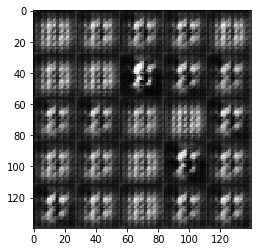

Epoch 1/2... Discriminator Loss: 0.8404... Generator Loss: 1.6870
Epoch 1/2... Discriminator Loss: 0.8235... Generator Loss: 1.3249
Epoch 1/2... Discriminator Loss: 0.5859... Generator Loss: 1.2584
Epoch 1/2... Discriminator Loss: 1.3364... Generator Loss: 4.1761
Epoch 1/2... Discriminator Loss: 0.9898... Generator Loss: 2.4430
Epoch 1/2... Discriminator Loss: 2.6671... Generator Loss: 5.8404
Epoch 1/2... Discriminator Loss: 1.6234... Generator Loss: 0.3847
Epoch 1/2... Discriminator Loss: 3.0451... Generator Loss: 0.0752
Epoch 1/2... Discriminator Loss: 1.1227... Generator Loss: 1.7144
Epoch 1/2... Discriminator Loss: 1.3404... Generator Loss: 2.9409


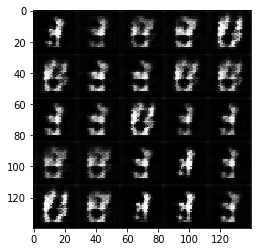

Epoch 1/2... Discriminator Loss: 0.6671... Generator Loss: 1.2086
Epoch 1/2... Discriminator Loss: 1.9539... Generator Loss: 0.1855
Epoch 1/2... Discriminator Loss: 0.5775... Generator Loss: 1.8491
Epoch 1/2... Discriminator Loss: 1.6356... Generator Loss: 0.3297
Epoch 1/2... Discriminator Loss: 0.9595... Generator Loss: 1.5135
Epoch 1/2... Discriminator Loss: 0.9511... Generator Loss: 0.7686
Epoch 1/2... Discriminator Loss: 0.8179... Generator Loss: 2.1100
Epoch 1/2... Discriminator Loss: 1.8290... Generator Loss: 6.3864
Epoch 1/2... Discriminator Loss: 1.4429... Generator Loss: 0.3366
Epoch 1/2... Discriminator Loss: 1.1779... Generator Loss: 1.5058


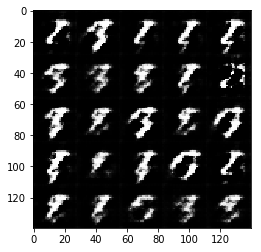

Epoch 1/2... Discriminator Loss: 1.4169... Generator Loss: 0.5347
Epoch 1/2... Discriminator Loss: 1.2692... Generator Loss: 0.8982
Epoch 1/2... Discriminator Loss: 1.1436... Generator Loss: 0.5286
Epoch 1/2... Discriminator Loss: 1.3465... Generator Loss: 0.4316
Epoch 1/2... Discriminator Loss: 0.7481... Generator Loss: 1.0444
Epoch 1/2... Discriminator Loss: 0.8063... Generator Loss: 1.2948
Epoch 1/2... Discriminator Loss: 1.4555... Generator Loss: 0.4513
Epoch 1/2... Discriminator Loss: 2.2209... Generator Loss: 0.1739
Epoch 1/2... Discriminator Loss: 1.4574... Generator Loss: 0.4515
Epoch 1/2... Discriminator Loss: 0.8652... Generator Loss: 0.8709


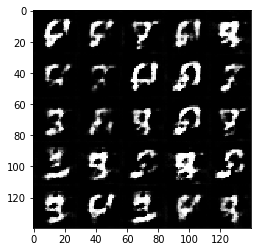

Epoch 1/2... Discriminator Loss: 1.0851... Generator Loss: 0.5539
Epoch 1/2... Discriminator Loss: 1.1462... Generator Loss: 1.1823
Epoch 1/2... Discriminator Loss: 1.4025... Generator Loss: 0.8933
Epoch 1/2... Discriminator Loss: 1.1654... Generator Loss: 0.9914
Epoch 1/2... Discriminator Loss: 1.3754... Generator Loss: 0.8153
Epoch 1/2... Discriminator Loss: 1.1773... Generator Loss: 1.8228
Epoch 1/2... Discriminator Loss: 1.2867... Generator Loss: 1.8863
Epoch 1/2... Discriminator Loss: 1.0019... Generator Loss: 0.8958
Epoch 1/2... Discriminator Loss: 1.4586... Generator Loss: 0.4679
Epoch 1/2... Discriminator Loss: 1.2640... Generator Loss: 1.5895


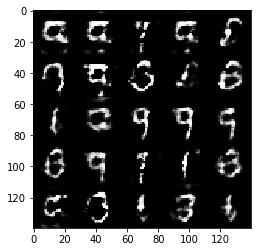

Epoch 1/2... Discriminator Loss: 1.1888... Generator Loss: 1.1945
Epoch 1/2... Discriminator Loss: 1.4297... Generator Loss: 0.4428
Epoch 1/2... Discriminator Loss: 1.1744... Generator Loss: 2.2099
Epoch 1/2... Discriminator Loss: 1.2184... Generator Loss: 0.6835
Epoch 1/2... Discriminator Loss: 1.1646... Generator Loss: 0.6461
Epoch 1/2... Discriminator Loss: 1.3042... Generator Loss: 0.5180
Epoch 1/2... Discriminator Loss: 1.3194... Generator Loss: 0.5853
Epoch 1/2... Discriminator Loss: 1.4357... Generator Loss: 0.4280
Epoch 1/2... Discriminator Loss: 1.2816... Generator Loss: 0.5964
Epoch 1/2... Discriminator Loss: 1.1886... Generator Loss: 0.6640


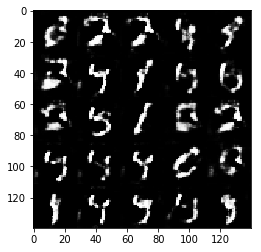

Epoch 1/2... Discriminator Loss: 1.0070... Generator Loss: 0.9880
Epoch 1/2... Discriminator Loss: 1.1222... Generator Loss: 1.5257
Epoch 1/2... Discriminator Loss: 1.2612... Generator Loss: 2.1891
Epoch 1/2... Discriminator Loss: 1.1179... Generator Loss: 0.8298
Epoch 1/2... Discriminator Loss: 1.5344... Generator Loss: 1.0082
Epoch 1/2... Discriminator Loss: 1.2268... Generator Loss: 1.3027
Epoch 1/2... Discriminator Loss: 1.0966... Generator Loss: 1.2445
Epoch 1/2... Discriminator Loss: 1.0658... Generator Loss: 1.0362
Epoch 1/2... Discriminator Loss: 1.4252... Generator Loss: 1.3045
Epoch 1/2... Discriminator Loss: 1.0675... Generator Loss: 1.2067


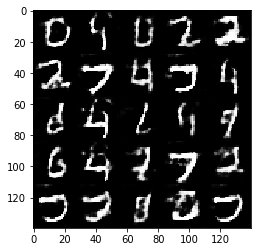

Epoch 1/2... Discriminator Loss: 1.2960... Generator Loss: 0.9521
Epoch 1/2... Discriminator Loss: 1.2513... Generator Loss: 0.6081
Epoch 1/2... Discriminator Loss: 1.2251... Generator Loss: 0.5319
Epoch 1/2... Discriminator Loss: 1.3945... Generator Loss: 0.4379
Epoch 1/2... Discriminator Loss: 1.6081... Generator Loss: 0.3546
Epoch 1/2... Discriminator Loss: 1.5088... Generator Loss: 0.3644
Epoch 1/2... Discriminator Loss: 1.1666... Generator Loss: 1.3991
Epoch 1/2... Discriminator Loss: 1.2427... Generator Loss: 1.5532
Epoch 1/2... Discriminator Loss: 1.4804... Generator Loss: 0.3587
Epoch 1/2... Discriminator Loss: 1.2282... Generator Loss: 0.5992


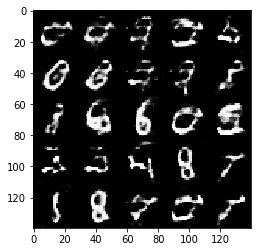

Epoch 1/2... Discriminator Loss: 1.6243... Generator Loss: 0.3138
Epoch 1/2... Discriminator Loss: 1.5534... Generator Loss: 0.3624
Epoch 1/2... Discriminator Loss: 1.3643... Generator Loss: 0.4321
Epoch 1/2... Discriminator Loss: 1.2421... Generator Loss: 0.5300
Epoch 1/2... Discriminator Loss: 1.7381... Generator Loss: 0.3482
Epoch 1/2... Discriminator Loss: 1.8973... Generator Loss: 0.2550
Epoch 1/2... Discriminator Loss: 1.4234... Generator Loss: 0.4213
Epoch 1/2... Discriminator Loss: 1.2955... Generator Loss: 0.5853
Epoch 1/2... Discriminator Loss: 1.6079... Generator Loss: 0.3454
Epoch 1/2... Discriminator Loss: 1.4510... Generator Loss: 0.4023


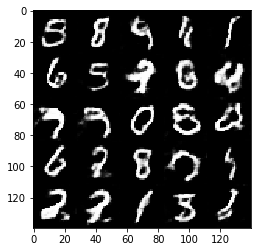

Epoch 1/2... Discriminator Loss: 1.3148... Generator Loss: 1.3604
Epoch 1/2... Discriminator Loss: 1.2983... Generator Loss: 1.5448
Epoch 1/2... Discriminator Loss: 1.3559... Generator Loss: 0.4315
Epoch 1/2... Discriminator Loss: 1.3607... Generator Loss: 1.6580
Epoch 1/2... Discriminator Loss: 1.5212... Generator Loss: 1.4907
Epoch 1/2... Discriminator Loss: 1.3020... Generator Loss: 1.3497
Epoch 1/2... Discriminator Loss: 1.3523... Generator Loss: 0.4518
Epoch 1/2... Discriminator Loss: 1.3732... Generator Loss: 0.4842
Epoch 1/2... Discriminator Loss: 1.1521... Generator Loss: 1.1490
Epoch 1/2... Discriminator Loss: 1.4776... Generator Loss: 0.4073


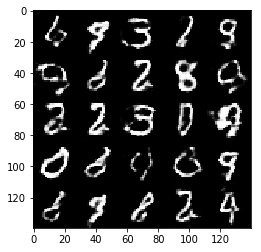

Epoch 1/2... Discriminator Loss: 1.4446... Generator Loss: 0.4056
Epoch 1/2... Discriminator Loss: 1.0907... Generator Loss: 0.7666
Epoch 1/2... Discriminator Loss: 1.5433... Generator Loss: 1.7756
Epoch 1/2... Discriminator Loss: 1.0624... Generator Loss: 0.8249
Epoch 1/2... Discriminator Loss: 2.0910... Generator Loss: 0.1867
Epoch 1/2... Discriminator Loss: 1.5697... Generator Loss: 0.3800
Epoch 1/2... Discriminator Loss: 1.3996... Generator Loss: 0.4745
Epoch 1/2... Discriminator Loss: 1.3976... Generator Loss: 0.4510
Epoch 1/2... Discriminator Loss: 1.4348... Generator Loss: 0.4344
Epoch 1/2... Discriminator Loss: 1.4622... Generator Loss: 0.3949


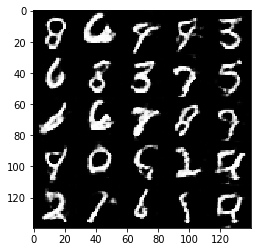

Epoch 1/2... Discriminator Loss: 1.2709... Generator Loss: 0.4813
Epoch 1/2... Discriminator Loss: 1.2805... Generator Loss: 0.5557
Epoch 1/2... Discriminator Loss: 1.1061... Generator Loss: 0.6945
Epoch 1/2... Discriminator Loss: 1.1402... Generator Loss: 0.6610
Epoch 1/2... Discriminator Loss: 1.2368... Generator Loss: 0.7538
Epoch 1/2... Discriminator Loss: 1.0420... Generator Loss: 0.9356
Epoch 1/2... Discriminator Loss: 1.2009... Generator Loss: 1.5019
Epoch 1/2... Discriminator Loss: 1.2710... Generator Loss: 0.7039
Epoch 1/2... Discriminator Loss: 1.2915... Generator Loss: 0.4964
Epoch 1/2... Discriminator Loss: 1.2798... Generator Loss: 1.0450


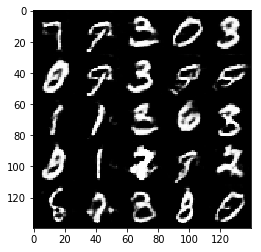

Epoch 2/2... Discriminator Loss: 1.3156... Generator Loss: 1.5970
Epoch 2/2... Discriminator Loss: 1.3975... Generator Loss: 0.4589
Epoch 2/2... Discriminator Loss: 1.3816... Generator Loss: 0.4408
Epoch 2/2... Discriminator Loss: 1.3690... Generator Loss: 1.0570
Epoch 2/2... Discriminator Loss: 1.1790... Generator Loss: 1.1141
Epoch 2/2... Discriminator Loss: 1.2616... Generator Loss: 0.5887
Epoch 2/2... Discriminator Loss: 1.1262... Generator Loss: 0.7646
Epoch 2/2... Discriminator Loss: 1.0176... Generator Loss: 1.1157
Epoch 2/2... Discriminator Loss: 1.2449... Generator Loss: 1.5115
Epoch 2/2... Discriminator Loss: 1.1637... Generator Loss: 0.9342


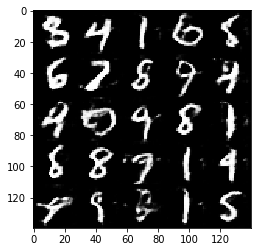

Epoch 2/2... Discriminator Loss: 1.2874... Generator Loss: 1.1907
Epoch 2/2... Discriminator Loss: 1.2868... Generator Loss: 0.4513
Epoch 2/2... Discriminator Loss: 1.1030... Generator Loss: 0.7491
Epoch 2/2... Discriminator Loss: 1.2772... Generator Loss: 1.1789
Epoch 2/2... Discriminator Loss: 1.2925... Generator Loss: 0.5732
Epoch 2/2... Discriminator Loss: 1.2333... Generator Loss: 0.4829
Epoch 2/2... Discriminator Loss: 1.2718... Generator Loss: 0.5542
Epoch 2/2... Discriminator Loss: 1.5607... Generator Loss: 0.3772
Epoch 2/2... Discriminator Loss: 1.5097... Generator Loss: 0.3613
Epoch 2/2... Discriminator Loss: 1.2069... Generator Loss: 0.7284


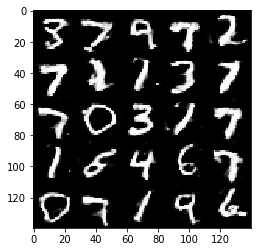

Epoch 2/2... Discriminator Loss: 1.6019... Generator Loss: 0.3720
Epoch 2/2... Discriminator Loss: 1.2480... Generator Loss: 0.9735
Epoch 2/2... Discriminator Loss: 1.5047... Generator Loss: 1.6667
Epoch 2/2... Discriminator Loss: 1.2970... Generator Loss: 1.4244
Epoch 2/2... Discriminator Loss: 1.4510... Generator Loss: 1.8909
Epoch 2/2... Discriminator Loss: 1.2028... Generator Loss: 1.0453
Epoch 2/2... Discriminator Loss: 1.1720... Generator Loss: 0.7004
Epoch 2/2... Discriminator Loss: 1.5353... Generator Loss: 0.4587
Epoch 2/2... Discriminator Loss: 1.4372... Generator Loss: 0.3868
Epoch 2/2... Discriminator Loss: 1.7053... Generator Loss: 0.2880


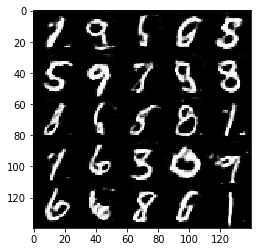

Epoch 2/2... Discriminator Loss: 1.3456... Generator Loss: 0.4372
Epoch 2/2... Discriminator Loss: 1.3888... Generator Loss: 0.4567
Epoch 2/2... Discriminator Loss: 1.2425... Generator Loss: 0.9996
Epoch 2/2... Discriminator Loss: 1.1214... Generator Loss: 0.7044
Epoch 2/2... Discriminator Loss: 1.4484... Generator Loss: 0.3599
Epoch 2/2... Discriminator Loss: 1.3819... Generator Loss: 0.4458
Epoch 2/2... Discriminator Loss: 1.4095... Generator Loss: 1.0448
Epoch 2/2... Discriminator Loss: 1.8202... Generator Loss: 2.1971
Epoch 2/2... Discriminator Loss: 1.2691... Generator Loss: 1.2479
Epoch 2/2... Discriminator Loss: 1.3037... Generator Loss: 1.6168


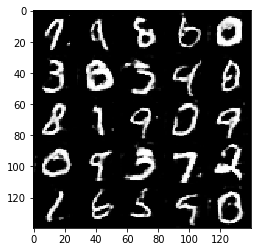

Epoch 2/2... Discriminator Loss: 1.3485... Generator Loss: 1.0190
Epoch 2/2... Discriminator Loss: 1.2534... Generator Loss: 1.6965
Epoch 2/2... Discriminator Loss: 1.3522... Generator Loss: 0.6803
Epoch 2/2... Discriminator Loss: 1.2728... Generator Loss: 0.5294
Epoch 2/2... Discriminator Loss: 1.2172... Generator Loss: 0.8374
Epoch 2/2... Discriminator Loss: 1.0528... Generator Loss: 0.9256
Epoch 2/2... Discriminator Loss: 1.4004... Generator Loss: 0.4902
Epoch 2/2... Discriminator Loss: 1.6876... Generator Loss: 0.3236
Epoch 2/2... Discriminator Loss: 1.0685... Generator Loss: 0.9463
Epoch 2/2... Discriminator Loss: 1.3577... Generator Loss: 1.6908


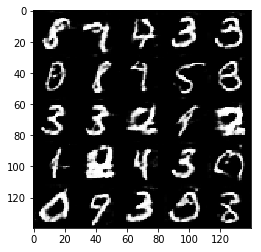

Epoch 2/2... Discriminator Loss: 1.0778... Generator Loss: 1.7769
Epoch 2/2... Discriminator Loss: 1.0166... Generator Loss: 1.2222
Epoch 2/2... Discriminator Loss: 1.4162... Generator Loss: 1.1253
Epoch 2/2... Discriminator Loss: 1.3020... Generator Loss: 1.7208
Epoch 2/2... Discriminator Loss: 1.1179... Generator Loss: 1.2239
Epoch 2/2... Discriminator Loss: 1.2416... Generator Loss: 0.5752
Epoch 2/2... Discriminator Loss: 1.2710... Generator Loss: 0.6168
Epoch 2/2... Discriminator Loss: 1.0991... Generator Loss: 0.6967
Epoch 2/2... Discriminator Loss: 1.1570... Generator Loss: 0.9396
Epoch 2/2... Discriminator Loss: 1.0818... Generator Loss: 0.8097


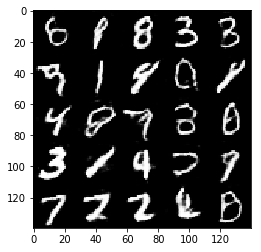

Epoch 2/2... Discriminator Loss: 1.2329... Generator Loss: 0.9856
Epoch 2/2... Discriminator Loss: 0.8945... Generator Loss: 1.2899
Epoch 2/2... Discriminator Loss: 0.8517... Generator Loss: 1.6162
Epoch 2/2... Discriminator Loss: 1.0390... Generator Loss: 1.3733
Epoch 2/2... Discriminator Loss: 1.0318... Generator Loss: 1.2669
Epoch 2/2... Discriminator Loss: 1.8378... Generator Loss: 2.3587
Epoch 2/2... Discriminator Loss: 1.5495... Generator Loss: 1.8073
Epoch 2/2... Discriminator Loss: 1.4741... Generator Loss: 0.3685
Epoch 2/2... Discriminator Loss: 1.2787... Generator Loss: 0.5053
Epoch 2/2... Discriminator Loss: 1.8596... Generator Loss: 0.2135


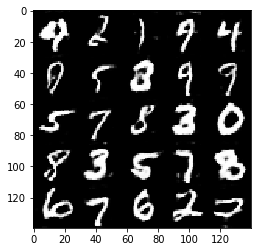

Epoch 2/2... Discriminator Loss: 1.0969... Generator Loss: 2.0192
Epoch 2/2... Discriminator Loss: 1.2653... Generator Loss: 1.0505
Epoch 2/2... Discriminator Loss: 0.9577... Generator Loss: 1.3003
Epoch 2/2... Discriminator Loss: 0.8754... Generator Loss: 1.0028
Epoch 2/2... Discriminator Loss: 1.6757... Generator Loss: 0.3014
Epoch 2/2... Discriminator Loss: 1.2367... Generator Loss: 0.4692
Epoch 2/2... Discriminator Loss: 1.4029... Generator Loss: 1.2582
Epoch 2/2... Discriminator Loss: 1.0370... Generator Loss: 1.9711
Epoch 2/2... Discriminator Loss: 0.8274... Generator Loss: 1.2636
Epoch 2/2... Discriminator Loss: 1.2103... Generator Loss: 1.0331


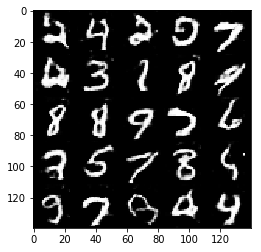

Epoch 2/2... Discriminator Loss: 1.1608... Generator Loss: 1.2687
Epoch 2/2... Discriminator Loss: 1.8372... Generator Loss: 0.2256
Epoch 2/2... Discriminator Loss: 1.4920... Generator Loss: 0.3548
Epoch 2/2... Discriminator Loss: 1.1345... Generator Loss: 0.8516
Epoch 2/2... Discriminator Loss: 1.3551... Generator Loss: 0.4432
Epoch 2/2... Discriminator Loss: 1.2491... Generator Loss: 1.6326
Epoch 2/2... Discriminator Loss: 1.0585... Generator Loss: 0.8434
Epoch 2/2... Discriminator Loss: 1.3784... Generator Loss: 0.5091
Epoch 2/2... Discriminator Loss: 1.2582... Generator Loss: 0.7432
Epoch 2/2... Discriminator Loss: 1.2637... Generator Loss: 0.4949


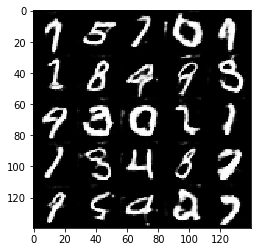

Epoch 2/2... Discriminator Loss: 1.1915... Generator Loss: 0.5185
Epoch 2/2... Discriminator Loss: 1.1244... Generator Loss: 0.7924
Epoch 2/2... Discriminator Loss: 1.0646... Generator Loss: 1.4668
Epoch 2/2... Discriminator Loss: 1.0689... Generator Loss: 0.7707
Epoch 2/2... Discriminator Loss: 0.9832... Generator Loss: 0.9180
Epoch 2/2... Discriminator Loss: 0.8690... Generator Loss: 1.0499
Epoch 2/2... Discriminator Loss: 1.2897... Generator Loss: 0.4552
Epoch 2/2... Discriminator Loss: 1.1380... Generator Loss: 1.2299
Epoch 2/2... Discriminator Loss: 1.1713... Generator Loss: 1.5850
Epoch 2/2... Discriminator Loss: 1.1384... Generator Loss: 0.5758


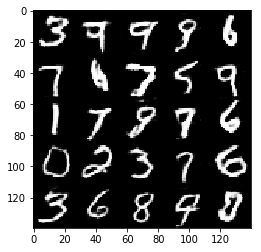

Epoch 2/2... Discriminator Loss: 1.3695... Generator Loss: 0.4630
Epoch 2/2... Discriminator Loss: 1.9561... Generator Loss: 2.0608
Epoch 2/2... Discriminator Loss: 1.1725... Generator Loss: 0.5670
Epoch 2/2... Discriminator Loss: 1.4435... Generator Loss: 0.6358
Epoch 2/2... Discriminator Loss: 1.1501... Generator Loss: 0.6275
Epoch 2/2... Discriminator Loss: 1.0012... Generator Loss: 1.5497
Epoch 2/2... Discriminator Loss: 1.0712... Generator Loss: 1.1176
Epoch 2/2... Discriminator Loss: 1.0570... Generator Loss: 1.3502
Epoch 2/2... Discriminator Loss: 1.4507... Generator Loss: 1.4640
Epoch 2/2... Discriminator Loss: 1.3124... Generator Loss: 1.3344


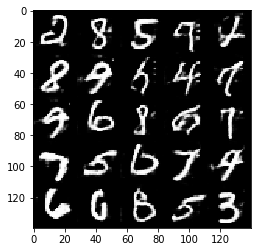

Epoch 2/2... Discriminator Loss: 0.6957... Generator Loss: 1.5495
Epoch 2/2... Discriminator Loss: 1.3349... Generator Loss: 0.5992
Epoch 2/2... Discriminator Loss: 1.4193... Generator Loss: 0.4090
Epoch 2/2... Discriminator Loss: 1.1661... Generator Loss: 0.5868
Epoch 2/2... Discriminator Loss: 1.2209... Generator Loss: 2.4961
Epoch 2/2... Discriminator Loss: 1.2228... Generator Loss: 1.6758
Epoch 2/2... Discriminator Loss: 0.9466... Generator Loss: 1.3671
Epoch 2/2... Discriminator Loss: 1.0664... Generator Loss: 0.6638
Epoch 2/2... Discriminator Loss: 1.2029... Generator Loss: 0.8653
Epoch 2/2... Discriminator Loss: 1.0863... Generator Loss: 0.7002


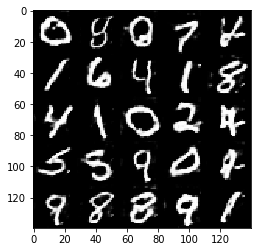

In [12]:
batch_size = 50
z_dim = 100
learning_rate = 0.2
beta1 = 0.3

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

Epoch 1/5... Discriminator Loss: 1.3219... Generator Loss: 0.4892
Epoch 1/5... Discriminator Loss: 4.5157... Generator Loss: 0.4212
Epoch 1/5... Discriminator Loss: 0.9536... Generator Loss: 0.9482
Epoch 1/5... Discriminator Loss: 0.7495... Generator Loss: 1.4849
Epoch 1/5... Discriminator Loss: 0.8331... Generator Loss: 1.3289
Epoch 1/5... Discriminator Loss: 2.2507... Generator Loss: 2.8820
Epoch 1/5... Discriminator Loss: 1.1566... Generator Loss: 2.4809
Epoch 1/5... Discriminator Loss: 1.1433... Generator Loss: 0.6299
Epoch 1/5... Discriminator Loss: 1.9609... Generator Loss: 1.6588
Epoch 1/5... Discriminator Loss: 2.2706... Generator Loss: 0.3761


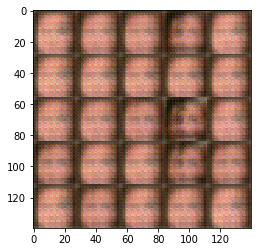

Epoch 1/5... Discriminator Loss: 1.2855... Generator Loss: 0.7670
Epoch 1/5... Discriminator Loss: 1.1744... Generator Loss: 0.8364
Epoch 1/5... Discriminator Loss: 1.0436... Generator Loss: 0.9502
Epoch 1/5... Discriminator Loss: 0.3707... Generator Loss: 1.5926
Epoch 1/5... Discriminator Loss: 2.2302... Generator Loss: 0.6552
Epoch 1/5... Discriminator Loss: 0.9105... Generator Loss: 1.1997
Epoch 1/5... Discriminator Loss: 1.9935... Generator Loss: 0.5963
Epoch 1/5... Discriminator Loss: 1.2424... Generator Loss: 0.5929
Epoch 1/5... Discriminator Loss: 1.4875... Generator Loss: 0.4063
Epoch 1/5... Discriminator Loss: 0.9580... Generator Loss: 0.5575


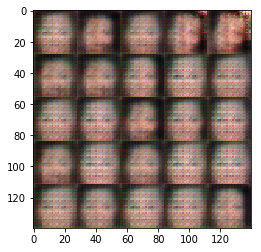

Epoch 1/5... Discriminator Loss: 0.9617... Generator Loss: 1.3173
Epoch 1/5... Discriminator Loss: 0.9692... Generator Loss: 1.8488
Epoch 1/5... Discriminator Loss: 0.8685... Generator Loss: 0.8660
Epoch 1/5... Discriminator Loss: 2.0734... Generator Loss: 0.3053
Epoch 1/5... Discriminator Loss: 1.1160... Generator Loss: 1.5129
Epoch 1/5... Discriminator Loss: 0.9344... Generator Loss: 1.0029
Epoch 1/5... Discriminator Loss: 1.7702... Generator Loss: 0.6011
Epoch 1/5... Discriminator Loss: 1.5375... Generator Loss: 0.7513
Epoch 1/5... Discriminator Loss: 1.0230... Generator Loss: 1.0583
Epoch 1/5... Discriminator Loss: 1.2459... Generator Loss: 0.8864


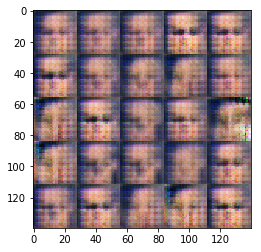

Epoch 1/5... Discriminator Loss: 1.0522... Generator Loss: 1.1671
Epoch 1/5... Discriminator Loss: 1.3000... Generator Loss: 1.8535
Epoch 1/5... Discriminator Loss: 0.9402... Generator Loss: 0.8809
Epoch 1/5... Discriminator Loss: 0.5595... Generator Loss: 1.6255
Epoch 1/5... Discriminator Loss: 2.4355... Generator Loss: 0.7992
Epoch 1/5... Discriminator Loss: 1.1467... Generator Loss: 1.5781
Epoch 1/5... Discriminator Loss: 1.3373... Generator Loss: 0.8742
Epoch 1/5... Discriminator Loss: 2.2697... Generator Loss: 0.5896
Epoch 1/5... Discriminator Loss: 1.5282... Generator Loss: 0.8199
Epoch 1/5... Discriminator Loss: 1.5200... Generator Loss: 0.6138


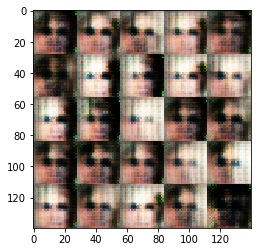

Epoch 1/5... Discriminator Loss: 0.8455... Generator Loss: 1.1443
Epoch 1/5... Discriminator Loss: 1.0278... Generator Loss: 0.8550
Epoch 1/5... Discriminator Loss: 1.1497... Generator Loss: 1.0166
Epoch 1/5... Discriminator Loss: 1.2684... Generator Loss: 1.8244
Epoch 1/5... Discriminator Loss: 1.0822... Generator Loss: 1.1920
Epoch 1/5... Discriminator Loss: 1.4261... Generator Loss: 1.0383
Epoch 1/5... Discriminator Loss: 1.3361... Generator Loss: 1.0504
Epoch 1/5... Discriminator Loss: 1.2282... Generator Loss: 0.8842
Epoch 1/5... Discriminator Loss: 1.1039... Generator Loss: 1.1399
Epoch 1/5... Discriminator Loss: 2.1275... Generator Loss: 0.2695


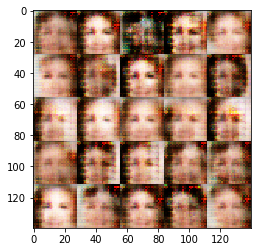

Epoch 1/5... Discriminator Loss: 1.4463... Generator Loss: 1.1030
Epoch 1/5... Discriminator Loss: 0.9110... Generator Loss: 0.8791
Epoch 1/5... Discriminator Loss: 0.9436... Generator Loss: 1.0580
Epoch 1/5... Discriminator Loss: 1.1336... Generator Loss: 1.0513
Epoch 1/5... Discriminator Loss: 1.0001... Generator Loss: 0.8117
Epoch 1/5... Discriminator Loss: 1.4470... Generator Loss: 0.4904
Epoch 1/5... Discriminator Loss: 1.3980... Generator Loss: 0.9309
Epoch 1/5... Discriminator Loss: 1.2254... Generator Loss: 0.5191
Epoch 1/5... Discriminator Loss: 1.8230... Generator Loss: 0.3026
Epoch 1/5... Discriminator Loss: 1.2122... Generator Loss: 0.5685


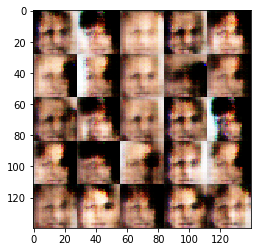

Epoch 1/5... Discriminator Loss: 0.8405... Generator Loss: 1.0528
Epoch 1/5... Discriminator Loss: 1.3920... Generator Loss: 1.4226
Epoch 1/5... Discriminator Loss: 0.6164... Generator Loss: 1.3126
Epoch 1/5... Discriminator Loss: 0.8813... Generator Loss: 1.1048
Epoch 1/5... Discriminator Loss: 1.5529... Generator Loss: 0.8072
Epoch 1/5... Discriminator Loss: 1.4800... Generator Loss: 0.9601
Epoch 1/5... Discriminator Loss: 1.6263... Generator Loss: 0.7800
Epoch 1/5... Discriminator Loss: 1.8530... Generator Loss: 0.6676
Epoch 1/5... Discriminator Loss: 1.1667... Generator Loss: 0.7352
Epoch 1/5... Discriminator Loss: 1.2775... Generator Loss: 0.9218


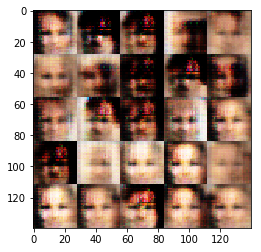

Epoch 1/5... Discriminator Loss: 1.0361... Generator Loss: 0.9467
Epoch 1/5... Discriminator Loss: 1.3863... Generator Loss: 0.5856
Epoch 1/5... Discriminator Loss: 1.2754... Generator Loss: 0.7526
Epoch 1/5... Discriminator Loss: 1.2451... Generator Loss: 1.0701
Epoch 1/5... Discriminator Loss: 1.1535... Generator Loss: 1.5216
Epoch 1/5... Discriminator Loss: 1.3621... Generator Loss: 0.6794
Epoch 1/5... Discriminator Loss: 1.2962... Generator Loss: 0.6447
Epoch 1/5... Discriminator Loss: 1.8617... Generator Loss: 0.4470
Epoch 1/5... Discriminator Loss: 1.3569... Generator Loss: 0.5298
Epoch 1/5... Discriminator Loss: 1.7827... Generator Loss: 0.2785


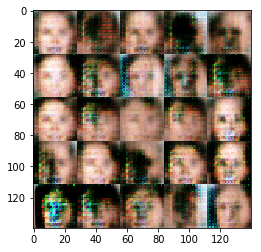

Epoch 1/5... Discriminator Loss: 1.4032... Generator Loss: 0.8205
Epoch 1/5... Discriminator Loss: 1.3090... Generator Loss: 0.9689
Epoch 1/5... Discriminator Loss: 1.2340... Generator Loss: 0.7964
Epoch 1/5... Discriminator Loss: 1.2086... Generator Loss: 0.6530
Epoch 1/5... Discriminator Loss: 1.2877... Generator Loss: 0.9684
Epoch 1/5... Discriminator Loss: 1.7426... Generator Loss: 0.7375
Epoch 1/5... Discriminator Loss: 1.1778... Generator Loss: 0.9510
Epoch 1/5... Discriminator Loss: 1.1097... Generator Loss: 0.5711
Epoch 1/5... Discriminator Loss: 1.3868... Generator Loss: 1.2859
Epoch 1/5... Discriminator Loss: 1.2685... Generator Loss: 1.2355


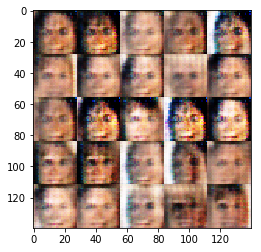

Epoch 1/5... Discriminator Loss: 0.9950... Generator Loss: 1.1034
Epoch 1/5... Discriminator Loss: 0.8080... Generator Loss: 0.9352
Epoch 1/5... Discriminator Loss: 1.2600... Generator Loss: 0.6938
Epoch 1/5... Discriminator Loss: 1.6148... Generator Loss: 0.3656
Epoch 1/5... Discriminator Loss: 1.3050... Generator Loss: 0.6806
Epoch 1/5... Discriminator Loss: 1.1213... Generator Loss: 0.5626
Epoch 1/5... Discriminator Loss: 1.2135... Generator Loss: 0.6999
Epoch 1/5... Discriminator Loss: 1.1724... Generator Loss: 0.8479
Epoch 1/5... Discriminator Loss: 1.3996... Generator Loss: 2.2002
Epoch 1/5... Discriminator Loss: 0.9715... Generator Loss: 1.9237


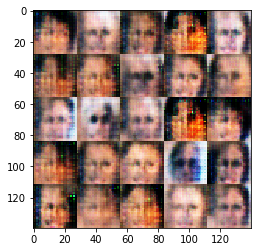

Epoch 1/5... Discriminator Loss: 1.7983... Generator Loss: 0.5355
Epoch 1/5... Discriminator Loss: 1.1203... Generator Loss: 0.9483
Epoch 1/5... Discriminator Loss: 0.9859... Generator Loss: 0.8760
Epoch 1/5... Discriminator Loss: 0.8155... Generator Loss: 0.9546
Epoch 1/5... Discriminator Loss: 1.1584... Generator Loss: 0.9965
Epoch 1/5... Discriminator Loss: 1.1963... Generator Loss: 0.9901
Epoch 1/5... Discriminator Loss: 1.2968... Generator Loss: 1.0557
Epoch 1/5... Discriminator Loss: 0.9432... Generator Loss: 1.1894
Epoch 1/5... Discriminator Loss: 1.1220... Generator Loss: 0.7460
Epoch 1/5... Discriminator Loss: 0.9617... Generator Loss: 1.8333


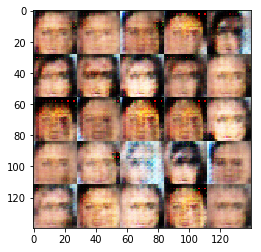

Epoch 1/5... Discriminator Loss: 0.9135... Generator Loss: 0.6682
Epoch 1/5... Discriminator Loss: 2.0249... Generator Loss: 3.2281
Epoch 1/5... Discriminator Loss: 1.6856... Generator Loss: 0.3180
Epoch 1/5... Discriminator Loss: 1.5906... Generator Loss: 0.4229
Epoch 1/5... Discriminator Loss: 1.4275... Generator Loss: 0.5971
Epoch 1/5... Discriminator Loss: 1.4267... Generator Loss: 0.7009
Epoch 1/5... Discriminator Loss: 1.4198... Generator Loss: 2.3108
Epoch 1/5... Discriminator Loss: 1.0449... Generator Loss: 1.1424
Epoch 1/5... Discriminator Loss: 1.3669... Generator Loss: 0.7201
Epoch 1/5... Discriminator Loss: 1.1081... Generator Loss: 0.7149


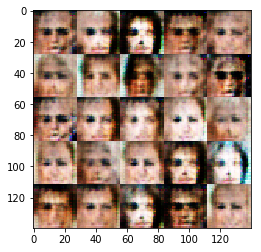

Epoch 1/5... Discriminator Loss: 1.1747... Generator Loss: 1.1237
Epoch 1/5... Discriminator Loss: 1.5539... Generator Loss: 1.5655
Epoch 1/5... Discriminator Loss: 1.5403... Generator Loss: 0.3690
Epoch 1/5... Discriminator Loss: 1.0986... Generator Loss: 0.7141
Epoch 1/5... Discriminator Loss: 1.8089... Generator Loss: 0.3078
Epoch 1/5... Discriminator Loss: 1.4729... Generator Loss: 0.6992
Epoch 1/5... Discriminator Loss: 1.4409... Generator Loss: 1.5140
Epoch 1/5... Discriminator Loss: 1.5197... Generator Loss: 2.0057
Epoch 1/5... Discriminator Loss: 1.0501... Generator Loss: 0.8467
Epoch 1/5... Discriminator Loss: 1.2640... Generator Loss: 1.3001


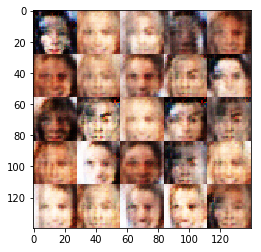

Epoch 1/5... Discriminator Loss: 1.1424... Generator Loss: 0.7992
Epoch 1/5... Discriminator Loss: 1.5330... Generator Loss: 0.4728
Epoch 1/5... Discriminator Loss: 1.2259... Generator Loss: 0.6569
Epoch 1/5... Discriminator Loss: 1.2597... Generator Loss: 0.8305
Epoch 1/5... Discriminator Loss: 1.3824... Generator Loss: 0.7329
Epoch 1/5... Discriminator Loss: 1.5554... Generator Loss: 1.6742
Epoch 1/5... Discriminator Loss: 1.0848... Generator Loss: 0.9840
Epoch 1/5... Discriminator Loss: 1.3327... Generator Loss: 0.7475
Epoch 1/5... Discriminator Loss: 0.9906... Generator Loss: 0.8944
Epoch 1/5... Discriminator Loss: 1.2646... Generator Loss: 0.9490


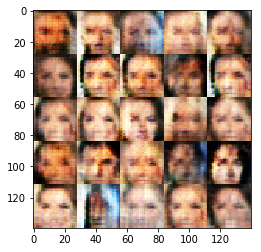

Epoch 1/5... Discriminator Loss: 1.1387... Generator Loss: 1.2594
Epoch 1/5... Discriminator Loss: 1.4869... Generator Loss: 0.4899
Epoch 1/5... Discriminator Loss: 1.3743... Generator Loss: 0.6161
Epoch 1/5... Discriminator Loss: 1.1263... Generator Loss: 0.9934
Epoch 1/5... Discriminator Loss: 1.2797... Generator Loss: 1.4148
Epoch 1/5... Discriminator Loss: 1.2008... Generator Loss: 1.4192
Epoch 1/5... Discriminator Loss: 1.2544... Generator Loss: 0.4377
Epoch 1/5... Discriminator Loss: 1.6117... Generator Loss: 2.5820
Epoch 1/5... Discriminator Loss: 1.5348... Generator Loss: 0.4808
Epoch 1/5... Discriminator Loss: 1.0963... Generator Loss: 0.8411


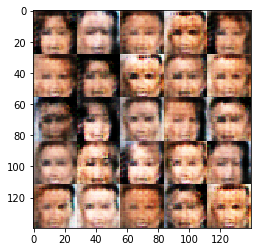

Epoch 1/5... Discriminator Loss: 1.1297... Generator Loss: 0.5585
Epoch 1/5... Discriminator Loss: 0.9682... Generator Loss: 0.6861
Epoch 1/5... Discriminator Loss: 1.4969... Generator Loss: 0.3898
Epoch 1/5... Discriminator Loss: 0.9288... Generator Loss: 0.9506
Epoch 1/5... Discriminator Loss: 1.3051... Generator Loss: 0.6251
Epoch 1/5... Discriminator Loss: 1.2865... Generator Loss: 0.8932
Epoch 1/5... Discriminator Loss: 1.3318... Generator Loss: 0.5609
Epoch 1/5... Discriminator Loss: 1.2572... Generator Loss: 0.9525
Epoch 1/5... Discriminator Loss: 1.4853... Generator Loss: 0.5253
Epoch 1/5... Discriminator Loss: 1.3161... Generator Loss: 1.0758


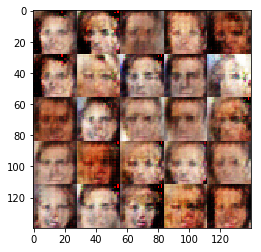

Epoch 1/5... Discriminator Loss: 1.1062... Generator Loss: 0.8666
Epoch 1/5... Discriminator Loss: 1.1430... Generator Loss: 0.7317
Epoch 1/5... Discriminator Loss: 1.2296... Generator Loss: 1.2961
Epoch 1/5... Discriminator Loss: 1.6006... Generator Loss: 1.5918
Epoch 1/5... Discriminator Loss: 1.1405... Generator Loss: 0.9653
Epoch 1/5... Discriminator Loss: 1.2240... Generator Loss: 1.4481
Epoch 1/5... Discriminator Loss: 1.2721... Generator Loss: 1.0541
Epoch 1/5... Discriminator Loss: 1.2258... Generator Loss: 0.8699
Epoch 1/5... Discriminator Loss: 1.8549... Generator Loss: 1.7623
Epoch 1/5... Discriminator Loss: 1.1696... Generator Loss: 1.3097


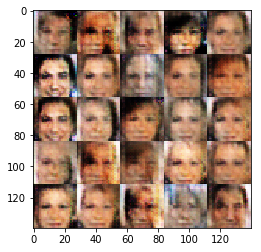

Epoch 1/5... Discriminator Loss: 1.1595... Generator Loss: 1.0297
Epoch 1/5... Discriminator Loss: 1.3772... Generator Loss: 0.5994
Epoch 1/5... Discriminator Loss: 1.2915... Generator Loss: 0.4848
Epoch 1/5... Discriminator Loss: 1.2244... Generator Loss: 1.0324
Epoch 1/5... Discriminator Loss: 1.3579... Generator Loss: 0.6489
Epoch 1/5... Discriminator Loss: 0.9539... Generator Loss: 1.0370
Epoch 1/5... Discriminator Loss: 1.1285... Generator Loss: 0.9542
Epoch 1/5... Discriminator Loss: 1.1234... Generator Loss: 1.5067
Epoch 1/5... Discriminator Loss: 1.3123... Generator Loss: 1.0271
Epoch 1/5... Discriminator Loss: 1.9383... Generator Loss: 2.7329


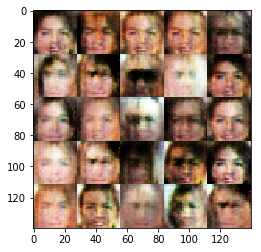

Epoch 1/5... Discriminator Loss: 1.1546... Generator Loss: 0.9411
Epoch 1/5... Discriminator Loss: 1.3279... Generator Loss: 0.9568
Epoch 1/5... Discriminator Loss: 1.3542... Generator Loss: 2.5363
Epoch 1/5... Discriminator Loss: 1.3742... Generator Loss: 0.8151
Epoch 1/5... Discriminator Loss: 1.3067... Generator Loss: 0.5892
Epoch 1/5... Discriminator Loss: 1.1202... Generator Loss: 1.1592
Epoch 1/5... Discriminator Loss: 1.2375... Generator Loss: 0.6565
Epoch 1/5... Discriminator Loss: 1.0824... Generator Loss: 0.8104
Epoch 1/5... Discriminator Loss: 1.0227... Generator Loss: 1.0362
Epoch 1/5... Discriminator Loss: 1.6166... Generator Loss: 0.4176


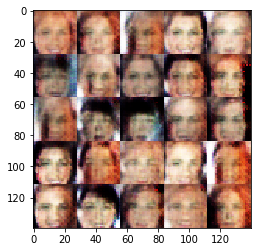

Epoch 1/5... Discriminator Loss: 1.6378... Generator Loss: 0.4670
Epoch 1/5... Discriminator Loss: 1.0867... Generator Loss: 1.4993
Epoch 1/5... Discriminator Loss: 1.6022... Generator Loss: 1.8349
Epoch 1/5... Discriminator Loss: 1.0834... Generator Loss: 0.7144
Epoch 1/5... Discriminator Loss: 1.2006... Generator Loss: 0.9591
Epoch 1/5... Discriminator Loss: 1.2227... Generator Loss: 1.4383
Epoch 1/5... Discriminator Loss: 0.9004... Generator Loss: 1.0322
Epoch 1/5... Discriminator Loss: 1.3648... Generator Loss: 0.7573
Epoch 1/5... Discriminator Loss: 1.3094... Generator Loss: 0.8232
Epoch 1/5... Discriminator Loss: 1.4689... Generator Loss: 1.5538


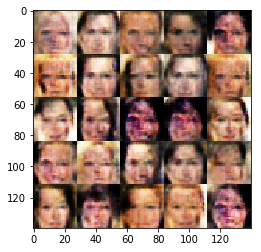

Epoch 1/5... Discriminator Loss: 1.5054... Generator Loss: 1.5583
Epoch 1/5... Discriminator Loss: 1.0834... Generator Loss: 0.7942
Epoch 2/5... Discriminator Loss: 1.0355... Generator Loss: 0.9653
Epoch 2/5... Discriminator Loss: 1.6342... Generator Loss: 1.4970
Epoch 2/5... Discriminator Loss: 1.4028... Generator Loss: 1.0105
Epoch 2/5... Discriminator Loss: 1.1954... Generator Loss: 0.6658
Epoch 2/5... Discriminator Loss: 1.0519... Generator Loss: 1.1961
Epoch 2/5... Discriminator Loss: 1.1013... Generator Loss: 1.2916
Epoch 2/5... Discriminator Loss: 0.8891... Generator Loss: 1.0747
Epoch 2/5... Discriminator Loss: 1.0271... Generator Loss: 1.2995


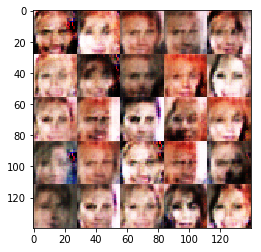

Epoch 2/5... Discriminator Loss: 1.1143... Generator Loss: 0.8782
Epoch 2/5... Discriminator Loss: 1.2578... Generator Loss: 1.2814
Epoch 2/5... Discriminator Loss: 1.2262... Generator Loss: 0.6542
Epoch 2/5... Discriminator Loss: 1.1503... Generator Loss: 0.6609
Epoch 2/5... Discriminator Loss: 1.1712... Generator Loss: 1.3171
Epoch 2/5... Discriminator Loss: 1.0194... Generator Loss: 1.0701
Epoch 2/5... Discriminator Loss: 1.1468... Generator Loss: 0.6629
Epoch 2/5... Discriminator Loss: 0.9630... Generator Loss: 1.0902
Epoch 2/5... Discriminator Loss: 1.1386... Generator Loss: 0.6920
Epoch 2/5... Discriminator Loss: 0.7812... Generator Loss: 1.0755


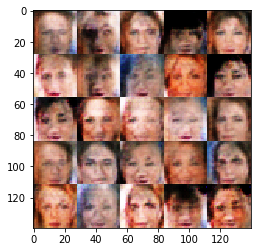

Epoch 2/5... Discriminator Loss: 1.1902... Generator Loss: 1.2555
Epoch 2/5... Discriminator Loss: 1.2383... Generator Loss: 0.7110
Epoch 2/5... Discriminator Loss: 1.3647... Generator Loss: 1.1313
Epoch 2/5... Discriminator Loss: 1.5244... Generator Loss: 1.3935
Epoch 2/5... Discriminator Loss: 1.0113... Generator Loss: 0.7093
Epoch 2/5... Discriminator Loss: 0.9021... Generator Loss: 0.8558
Epoch 2/5... Discriminator Loss: 1.4049... Generator Loss: 1.4039
Epoch 2/5... Discriminator Loss: 1.4982... Generator Loss: 0.7884
Epoch 2/5... Discriminator Loss: 1.3031... Generator Loss: 0.4958
Epoch 2/5... Discriminator Loss: 1.0313... Generator Loss: 0.8268


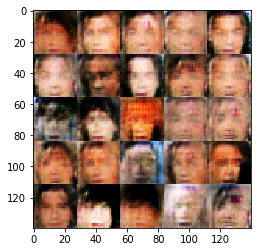

Epoch 2/5... Discriminator Loss: 1.1777... Generator Loss: 0.5622
Epoch 2/5... Discriminator Loss: 1.6362... Generator Loss: 0.5192
Epoch 2/5... Discriminator Loss: 1.3433... Generator Loss: 0.5459
Epoch 2/5... Discriminator Loss: 0.9423... Generator Loss: 0.9690
Epoch 2/5... Discriminator Loss: 1.0792... Generator Loss: 1.8248
Epoch 2/5... Discriminator Loss: 1.1465... Generator Loss: 1.4004
Epoch 2/5... Discriminator Loss: 1.3134... Generator Loss: 0.6997
Epoch 2/5... Discriminator Loss: 1.2777... Generator Loss: 0.8851
Epoch 2/5... Discriminator Loss: 1.3769... Generator Loss: 1.4404
Epoch 2/5... Discriminator Loss: 1.2166... Generator Loss: 0.7713


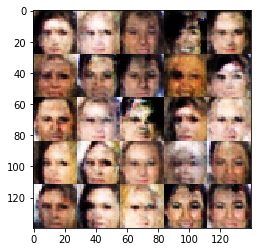

Epoch 2/5... Discriminator Loss: 1.1331... Generator Loss: 0.5432
Epoch 2/5... Discriminator Loss: 1.3552... Generator Loss: 0.5808
Epoch 2/5... Discriminator Loss: 1.0762... Generator Loss: 0.9353
Epoch 2/5... Discriminator Loss: 1.0996... Generator Loss: 1.5177
Epoch 2/5... Discriminator Loss: 1.2493... Generator Loss: 0.6544
Epoch 2/5... Discriminator Loss: 1.0781... Generator Loss: 1.2113
Epoch 2/5... Discriminator Loss: 0.9752... Generator Loss: 0.7033
Epoch 2/5... Discriminator Loss: 1.4977... Generator Loss: 0.5357
Epoch 2/5... Discriminator Loss: 1.3489... Generator Loss: 1.1699
Epoch 2/5... Discriminator Loss: 1.0428... Generator Loss: 1.5323


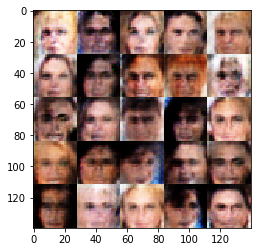

Epoch 2/5... Discriminator Loss: 0.8986... Generator Loss: 0.9504
Epoch 2/5... Discriminator Loss: 1.7854... Generator Loss: 0.2575
Epoch 2/5... Discriminator Loss: 0.9785... Generator Loss: 1.0282
Epoch 2/5... Discriminator Loss: 1.3428... Generator Loss: 0.7117
Epoch 2/5... Discriminator Loss: 1.7868... Generator Loss: 1.8480
Epoch 2/5... Discriminator Loss: 1.5281... Generator Loss: 0.6654
Epoch 2/5... Discriminator Loss: 1.2594... Generator Loss: 0.5942
Epoch 2/5... Discriminator Loss: 1.2115... Generator Loss: 0.9821
Epoch 2/5... Discriminator Loss: 0.8641... Generator Loss: 1.3161
Epoch 2/5... Discriminator Loss: 1.3011... Generator Loss: 0.4943


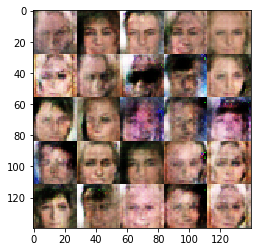

Epoch 2/5... Discriminator Loss: 1.2167... Generator Loss: 0.4588
Epoch 2/5... Discriminator Loss: 1.5320... Generator Loss: 1.9483
Epoch 2/5... Discriminator Loss: 1.3687... Generator Loss: 0.9319
Epoch 2/5... Discriminator Loss: 1.1256... Generator Loss: 0.9879
Epoch 2/5... Discriminator Loss: 1.2229... Generator Loss: 1.7825
Epoch 2/5... Discriminator Loss: 1.6404... Generator Loss: 0.4154
Epoch 2/5... Discriminator Loss: 1.3869... Generator Loss: 1.1306
Epoch 2/5... Discriminator Loss: 1.4785... Generator Loss: 0.5565
Epoch 2/5... Discriminator Loss: 1.5422... Generator Loss: 0.4724
Epoch 2/5... Discriminator Loss: 1.3277... Generator Loss: 1.0110


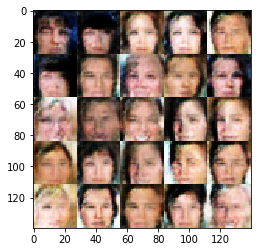

Epoch 2/5... Discriminator Loss: 1.1625... Generator Loss: 1.3659
Epoch 2/5... Discriminator Loss: 1.4216... Generator Loss: 1.5677
Epoch 2/5... Discriminator Loss: 1.6252... Generator Loss: 0.4158
Epoch 2/5... Discriminator Loss: 1.5781... Generator Loss: 0.3586
Epoch 2/5... Discriminator Loss: 1.1672... Generator Loss: 0.8221
Epoch 2/5... Discriminator Loss: 1.0769... Generator Loss: 0.7550
Epoch 2/5... Discriminator Loss: 1.1342... Generator Loss: 0.9327
Epoch 2/5... Discriminator Loss: 1.1482... Generator Loss: 0.9681
Epoch 2/5... Discriminator Loss: 1.3743... Generator Loss: 1.8048
Epoch 2/5... Discriminator Loss: 0.7524... Generator Loss: 1.3229


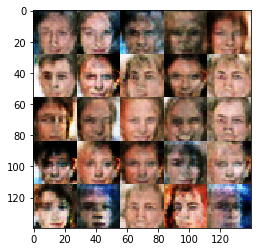

Epoch 2/5... Discriminator Loss: 1.1025... Generator Loss: 0.7449
Epoch 2/5... Discriminator Loss: 1.5041... Generator Loss: 1.6249
Epoch 2/5... Discriminator Loss: 1.1230... Generator Loss: 0.8175
Epoch 2/5... Discriminator Loss: 1.2018... Generator Loss: 0.5217
Epoch 2/5... Discriminator Loss: 1.3884... Generator Loss: 0.4267
Epoch 2/5... Discriminator Loss: 1.1319... Generator Loss: 1.0757
Epoch 2/5... Discriminator Loss: 1.3529... Generator Loss: 1.1171
Epoch 2/5... Discriminator Loss: 0.8976... Generator Loss: 1.0472
Epoch 2/5... Discriminator Loss: 1.2586... Generator Loss: 1.2391
Epoch 2/5... Discriminator Loss: 1.1431... Generator Loss: 0.5968


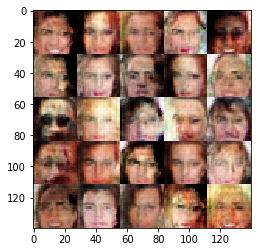

Epoch 2/5... Discriminator Loss: 1.2222... Generator Loss: 0.7884
Epoch 2/5... Discriminator Loss: 1.2218... Generator Loss: 0.9380
Epoch 2/5... Discriminator Loss: 1.6917... Generator Loss: 0.5218
Epoch 2/5... Discriminator Loss: 1.0537... Generator Loss: 0.8770
Epoch 2/5... Discriminator Loss: 1.2677... Generator Loss: 1.0772
Epoch 2/5... Discriminator Loss: 1.4356... Generator Loss: 0.6420
Epoch 2/5... Discriminator Loss: 1.2642... Generator Loss: 0.5087
Epoch 2/5... Discriminator Loss: 1.1054... Generator Loss: 1.5336
Epoch 2/5... Discriminator Loss: 1.1073... Generator Loss: 0.8523
Epoch 2/5... Discriminator Loss: 1.2545... Generator Loss: 1.5166


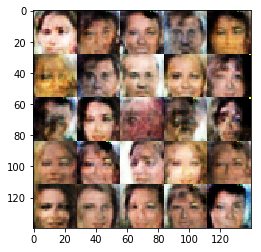

Epoch 2/5... Discriminator Loss: 1.2513... Generator Loss: 0.7422
Epoch 2/5... Discriminator Loss: 1.1638... Generator Loss: 0.7202
Epoch 2/5... Discriminator Loss: 1.2738... Generator Loss: 0.7526
Epoch 2/5... Discriminator Loss: 1.2061... Generator Loss: 0.6604
Epoch 2/5... Discriminator Loss: 1.0391... Generator Loss: 0.7216
Epoch 2/5... Discriminator Loss: 1.0797... Generator Loss: 0.7843
Epoch 2/5... Discriminator Loss: 1.2895... Generator Loss: 0.5073
Epoch 2/5... Discriminator Loss: 1.0851... Generator Loss: 1.0166
Epoch 2/5... Discriminator Loss: 1.1552... Generator Loss: 1.2181
Epoch 2/5... Discriminator Loss: 0.9809... Generator Loss: 1.3965


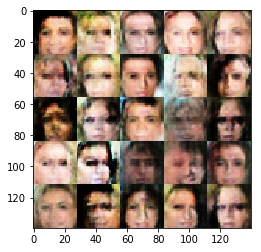

Epoch 2/5... Discriminator Loss: 1.1483... Generator Loss: 0.6869
Epoch 2/5... Discriminator Loss: 1.2902... Generator Loss: 0.5562
Epoch 2/5... Discriminator Loss: 1.1687... Generator Loss: 0.7273
Epoch 2/5... Discriminator Loss: 1.2159... Generator Loss: 1.5401
Epoch 2/5... Discriminator Loss: 1.1444... Generator Loss: 0.6367
Epoch 2/5... Discriminator Loss: 1.1293... Generator Loss: 1.0584
Epoch 2/5... Discriminator Loss: 1.4290... Generator Loss: 2.2871
Epoch 2/5... Discriminator Loss: 1.1644... Generator Loss: 0.9035
Epoch 2/5... Discriminator Loss: 0.9805... Generator Loss: 0.9117
Epoch 2/5... Discriminator Loss: 1.3227... Generator Loss: 0.7463


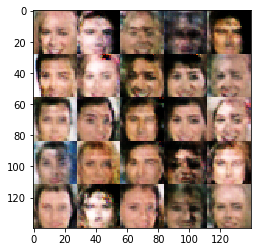

Epoch 2/5... Discriminator Loss: 1.3589... Generator Loss: 0.6940
Epoch 2/5... Discriminator Loss: 1.2457... Generator Loss: 1.2244
Epoch 2/5... Discriminator Loss: 0.8660... Generator Loss: 1.1191
Epoch 2/5... Discriminator Loss: 1.3643... Generator Loss: 0.6675
Epoch 2/5... Discriminator Loss: 1.5052... Generator Loss: 0.4192
Epoch 2/5... Discriminator Loss: 0.8971... Generator Loss: 1.2103
Epoch 2/5... Discriminator Loss: 1.2658... Generator Loss: 1.9472
Epoch 2/5... Discriminator Loss: 0.9306... Generator Loss: 0.9949
Epoch 2/5... Discriminator Loss: 1.2512... Generator Loss: 0.6398
Epoch 2/5... Discriminator Loss: 0.9687... Generator Loss: 0.9645


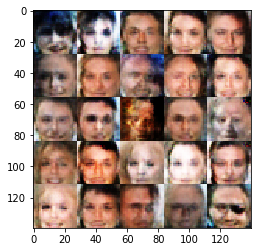

Epoch 2/5... Discriminator Loss: 1.0505... Generator Loss: 0.9028
Epoch 2/5... Discriminator Loss: 0.9992... Generator Loss: 1.1690
Epoch 2/5... Discriminator Loss: 1.2930... Generator Loss: 0.5424
Epoch 2/5... Discriminator Loss: 1.1119... Generator Loss: 0.8443
Epoch 2/5... Discriminator Loss: 1.9256... Generator Loss: 0.2082
Epoch 2/5... Discriminator Loss: 1.3069... Generator Loss: 1.6363
Epoch 2/5... Discriminator Loss: 1.0225... Generator Loss: 0.8922
Epoch 2/5... Discriminator Loss: 1.1718... Generator Loss: 0.8127
Epoch 2/5... Discriminator Loss: 1.2688... Generator Loss: 0.5527
Epoch 2/5... Discriminator Loss: 0.8502... Generator Loss: 0.8617


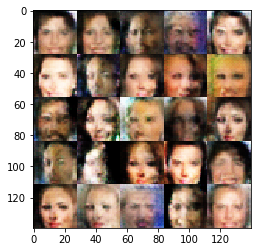

Epoch 2/5... Discriminator Loss: 1.3731... Generator Loss: 0.6936
Epoch 2/5... Discriminator Loss: 1.3148... Generator Loss: 0.7612
Epoch 2/5... Discriminator Loss: 1.1448... Generator Loss: 1.5514
Epoch 2/5... Discriminator Loss: 1.2760... Generator Loss: 1.7869
Epoch 2/5... Discriminator Loss: 1.1243... Generator Loss: 1.4323
Epoch 2/5... Discriminator Loss: 0.9856... Generator Loss: 1.0557
Epoch 2/5... Discriminator Loss: 1.2230... Generator Loss: 1.6680
Epoch 2/5... Discriminator Loss: 0.9920... Generator Loss: 0.7427
Epoch 2/5... Discriminator Loss: 1.3807... Generator Loss: 1.5629
Epoch 2/5... Discriminator Loss: 1.4035... Generator Loss: 0.3952


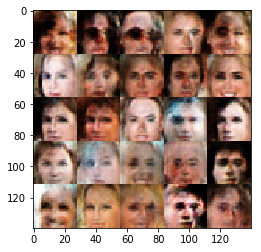

Epoch 2/5... Discriminator Loss: 0.9921... Generator Loss: 0.8337
Epoch 2/5... Discriminator Loss: 1.3940... Generator Loss: 0.5077
Epoch 2/5... Discriminator Loss: 1.5991... Generator Loss: 0.3606
Epoch 2/5... Discriminator Loss: 0.9935... Generator Loss: 1.2490
Epoch 2/5... Discriminator Loss: 1.4170... Generator Loss: 0.4485
Epoch 2/5... Discriminator Loss: 1.6933... Generator Loss: 0.2794
Epoch 2/5... Discriminator Loss: 0.9754... Generator Loss: 1.0098
Epoch 2/5... Discriminator Loss: 0.7608... Generator Loss: 1.3576
Epoch 2/5... Discriminator Loss: 1.2682... Generator Loss: 0.9651
Epoch 2/5... Discriminator Loss: 0.9793... Generator Loss: 0.7763


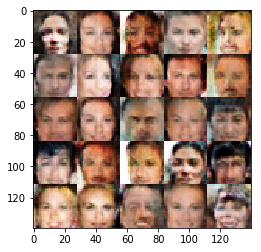

Epoch 2/5... Discriminator Loss: 1.0760... Generator Loss: 0.9505
Epoch 2/5... Discriminator Loss: 1.3288... Generator Loss: 1.3673
Epoch 2/5... Discriminator Loss: 1.0720... Generator Loss: 0.9197
Epoch 2/5... Discriminator Loss: 1.1729... Generator Loss: 0.6287
Epoch 2/5... Discriminator Loss: 2.2339... Generator Loss: 2.5443
Epoch 2/5... Discriminator Loss: 1.1664... Generator Loss: 0.6964
Epoch 2/5... Discriminator Loss: 1.2499... Generator Loss: 0.4817
Epoch 2/5... Discriminator Loss: 0.9431... Generator Loss: 1.2009
Epoch 2/5... Discriminator Loss: 1.2782... Generator Loss: 0.5282
Epoch 2/5... Discriminator Loss: 1.0243... Generator Loss: 0.9521


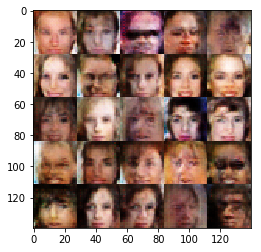

Epoch 2/5... Discriminator Loss: 1.5084... Generator Loss: 0.3835
Epoch 2/5... Discriminator Loss: 1.1036... Generator Loss: 1.2220
Epoch 2/5... Discriminator Loss: 0.9615... Generator Loss: 1.0278
Epoch 2/5... Discriminator Loss: 1.1282... Generator Loss: 1.3901
Epoch 2/5... Discriminator Loss: 1.3329... Generator Loss: 0.6282
Epoch 2/5... Discriminator Loss: 1.0705... Generator Loss: 0.9839
Epoch 2/5... Discriminator Loss: 1.1531... Generator Loss: 0.7128
Epoch 2/5... Discriminator Loss: 1.0533... Generator Loss: 0.9322
Epoch 2/5... Discriminator Loss: 1.1937... Generator Loss: 0.7352
Epoch 2/5... Discriminator Loss: 1.2128... Generator Loss: 1.0681


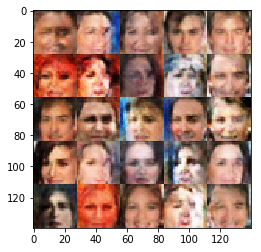

Epoch 2/5... Discriminator Loss: 1.3447... Generator Loss: 0.5566
Epoch 2/5... Discriminator Loss: 1.2305... Generator Loss: 0.5636
Epoch 2/5... Discriminator Loss: 0.9492... Generator Loss: 0.9297
Epoch 2/5... Discriminator Loss: 1.7590... Generator Loss: 0.2965
Epoch 2/5... Discriminator Loss: 1.4683... Generator Loss: 0.4440
Epoch 2/5... Discriminator Loss: 1.1582... Generator Loss: 1.2635
Epoch 2/5... Discriminator Loss: 1.1822... Generator Loss: 0.6817
Epoch 2/5... Discriminator Loss: 1.1552... Generator Loss: 0.7442
Epoch 2/5... Discriminator Loss: 1.0995... Generator Loss: 0.6705
Epoch 2/5... Discriminator Loss: 0.8389... Generator Loss: 0.9180


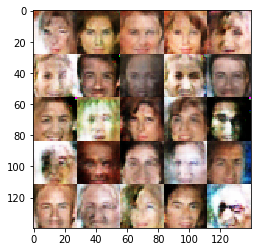

Epoch 2/5... Discriminator Loss: 1.2301... Generator Loss: 1.0945
Epoch 2/5... Discriminator Loss: 0.9088... Generator Loss: 1.1121
Epoch 2/5... Discriminator Loss: 1.0738... Generator Loss: 0.9282
Epoch 2/5... Discriminator Loss: 1.2486... Generator Loss: 1.0830
Epoch 2/5... Discriminator Loss: 0.9726... Generator Loss: 0.8863
Epoch 2/5... Discriminator Loss: 1.2546... Generator Loss: 0.5404
Epoch 2/5... Discriminator Loss: 1.2858... Generator Loss: 1.6314
Epoch 2/5... Discriminator Loss: 1.1113... Generator Loss: 1.0365
Epoch 2/5... Discriminator Loss: 1.1630... Generator Loss: 0.7493
Epoch 2/5... Discriminator Loss: 1.7655... Generator Loss: 2.2490


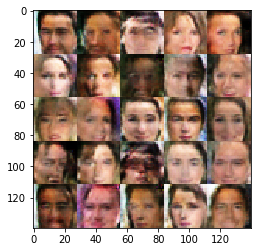

Epoch 2/5... Discriminator Loss: 1.0841... Generator Loss: 0.8597
Epoch 2/5... Discriminator Loss: 1.0827... Generator Loss: 0.8743
Epoch 2/5... Discriminator Loss: 1.5998... Generator Loss: 0.3934
Epoch 2/5... Discriminator Loss: 1.0689... Generator Loss: 1.0446
Epoch 2/5... Discriminator Loss: 0.8984... Generator Loss: 0.8273
Epoch 3/5... Discriminator Loss: 1.1575... Generator Loss: 0.8305
Epoch 3/5... Discriminator Loss: 1.0239... Generator Loss: 0.8805
Epoch 3/5... Discriminator Loss: 1.0182... Generator Loss: 0.6823
Epoch 3/5... Discriminator Loss: 1.2569... Generator Loss: 0.9180
Epoch 3/5... Discriminator Loss: 1.3012... Generator Loss: 0.6738


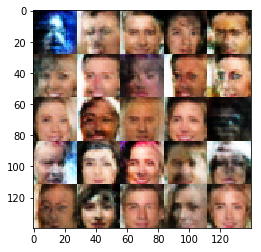

Epoch 3/5... Discriminator Loss: 1.2124... Generator Loss: 0.8271
Epoch 3/5... Discriminator Loss: 1.1142... Generator Loss: 0.9552
Epoch 3/5... Discriminator Loss: 1.2995... Generator Loss: 0.6238
Epoch 3/5... Discriminator Loss: 1.3486... Generator Loss: 0.6066
Epoch 3/5... Discriminator Loss: 1.3320... Generator Loss: 0.6102
Epoch 3/5... Discriminator Loss: 0.9425... Generator Loss: 1.0298
Epoch 3/5... Discriminator Loss: 1.2444... Generator Loss: 1.2919
Epoch 3/5... Discriminator Loss: 1.3705... Generator Loss: 0.5561
Epoch 3/5... Discriminator Loss: 1.2852... Generator Loss: 0.8349
Epoch 3/5... Discriminator Loss: 1.1374... Generator Loss: 0.8607


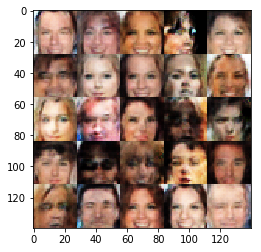

Epoch 3/5... Discriminator Loss: 1.3165... Generator Loss: 0.8439
Epoch 3/5... Discriminator Loss: 1.2629... Generator Loss: 0.8294
Epoch 3/5... Discriminator Loss: 1.1935... Generator Loss: 0.6070
Epoch 3/5... Discriminator Loss: 1.3706... Generator Loss: 0.7891
Epoch 3/5... Discriminator Loss: 1.3237... Generator Loss: 0.7307
Epoch 3/5... Discriminator Loss: 1.1375... Generator Loss: 0.8160
Epoch 3/5... Discriminator Loss: 1.8451... Generator Loss: 0.2770
Epoch 3/5... Discriminator Loss: 1.2172... Generator Loss: 0.7740
Epoch 3/5... Discriminator Loss: 1.4864... Generator Loss: 1.8471
Epoch 3/5... Discriminator Loss: 1.1487... Generator Loss: 0.5940


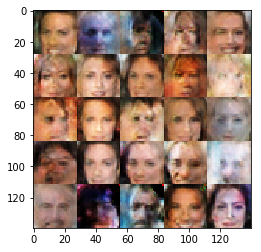

Epoch 3/5... Discriminator Loss: 1.1871... Generator Loss: 0.8960
Epoch 3/5... Discriminator Loss: 1.4382... Generator Loss: 0.6895
Epoch 3/5... Discriminator Loss: 1.3356... Generator Loss: 0.5423
Epoch 3/5... Discriminator Loss: 1.1186... Generator Loss: 0.7723
Epoch 3/5... Discriminator Loss: 1.2221... Generator Loss: 1.1475
Epoch 3/5... Discriminator Loss: 1.3271... Generator Loss: 0.5626
Epoch 3/5... Discriminator Loss: 1.1667... Generator Loss: 1.5093
Epoch 3/5... Discriminator Loss: 1.2278... Generator Loss: 0.6842
Epoch 3/5... Discriminator Loss: 1.1295... Generator Loss: 0.6343
Epoch 3/5... Discriminator Loss: 1.1742... Generator Loss: 1.0721


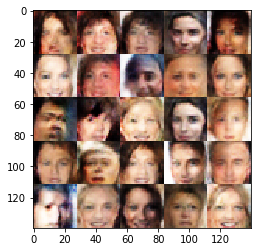

Epoch 3/5... Discriminator Loss: 1.3019... Generator Loss: 0.6727
Epoch 3/5... Discriminator Loss: 1.1023... Generator Loss: 0.7691
Epoch 3/5... Discriminator Loss: 1.3496... Generator Loss: 0.6165
Epoch 3/5... Discriminator Loss: 1.3376... Generator Loss: 0.8518
Epoch 3/5... Discriminator Loss: 1.0475... Generator Loss: 0.7430
Epoch 3/5... Discriminator Loss: 1.1769... Generator Loss: 0.7278
Epoch 3/5... Discriminator Loss: 1.0752... Generator Loss: 0.7209
Epoch 3/5... Discriminator Loss: 1.1427... Generator Loss: 0.9437
Epoch 3/5... Discriminator Loss: 1.2050... Generator Loss: 0.6772
Epoch 3/5... Discriminator Loss: 1.3239... Generator Loss: 0.9173


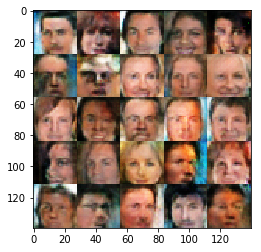

Epoch 3/5... Discriminator Loss: 1.1894... Generator Loss: 0.8345
Epoch 3/5... Discriminator Loss: 1.0512... Generator Loss: 1.2804
Epoch 3/5... Discriminator Loss: 1.1440... Generator Loss: 0.8878
Epoch 3/5... Discriminator Loss: 1.3277... Generator Loss: 1.4476
Epoch 3/5... Discriminator Loss: 1.0487... Generator Loss: 0.7394
Epoch 3/5... Discriminator Loss: 1.1352... Generator Loss: 0.9820
Epoch 3/5... Discriminator Loss: 1.3511... Generator Loss: 1.4377
Epoch 3/5... Discriminator Loss: 1.2623... Generator Loss: 0.6414
Epoch 3/5... Discriminator Loss: 1.2769... Generator Loss: 0.7589
Epoch 3/5... Discriminator Loss: 1.3344... Generator Loss: 1.2820


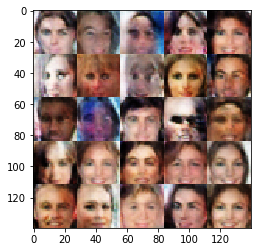

Epoch 3/5... Discriminator Loss: 1.1562... Generator Loss: 0.6340
Epoch 3/5... Discriminator Loss: 1.1496... Generator Loss: 0.7288
Epoch 3/5... Discriminator Loss: 1.0661... Generator Loss: 0.8789
Epoch 3/5... Discriminator Loss: 1.2003... Generator Loss: 0.7735
Epoch 3/5... Discriminator Loss: 1.3999... Generator Loss: 0.4593
Epoch 3/5... Discriminator Loss: 1.2496... Generator Loss: 0.8192
Epoch 3/5... Discriminator Loss: 1.2693... Generator Loss: 1.2295
Epoch 3/5... Discriminator Loss: 1.0988... Generator Loss: 0.9262
Epoch 3/5... Discriminator Loss: 1.1144... Generator Loss: 0.8569
Epoch 3/5... Discriminator Loss: 1.0955... Generator Loss: 1.1479


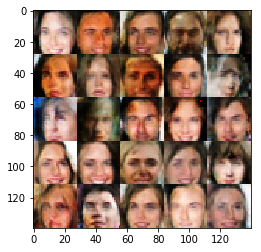

Epoch 3/5... Discriminator Loss: 1.2465... Generator Loss: 1.2265
Epoch 3/5... Discriminator Loss: 1.2318... Generator Loss: 0.6970
Epoch 3/5... Discriminator Loss: 1.3791... Generator Loss: 0.5788
Epoch 3/5... Discriminator Loss: 1.0507... Generator Loss: 0.7743
Epoch 3/5... Discriminator Loss: 1.7087... Generator Loss: 1.7840
Epoch 3/5... Discriminator Loss: 1.2083... Generator Loss: 0.6725
Epoch 3/5... Discriminator Loss: 1.2114... Generator Loss: 0.8057
Epoch 3/5... Discriminator Loss: 1.1142... Generator Loss: 0.8321
Epoch 3/5... Discriminator Loss: 1.2453... Generator Loss: 0.7536
Epoch 3/5... Discriminator Loss: 1.3192... Generator Loss: 0.6488


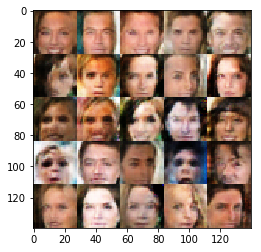

Epoch 3/5... Discriminator Loss: 1.1144... Generator Loss: 0.7589
Epoch 3/5... Discriminator Loss: 1.2102... Generator Loss: 0.6622
Epoch 3/5... Discriminator Loss: 1.3902... Generator Loss: 0.6401
Epoch 3/5... Discriminator Loss: 1.1335... Generator Loss: 0.8223
Epoch 3/5... Discriminator Loss: 1.2394... Generator Loss: 0.5052
Epoch 3/5... Discriminator Loss: 1.3832... Generator Loss: 0.8621
Epoch 3/5... Discriminator Loss: 1.1978... Generator Loss: 0.5521
Epoch 3/5... Discriminator Loss: 1.1954... Generator Loss: 0.5586
Epoch 3/5... Discriminator Loss: 1.1211... Generator Loss: 1.0298
Epoch 3/5... Discriminator Loss: 1.1089... Generator Loss: 0.9298


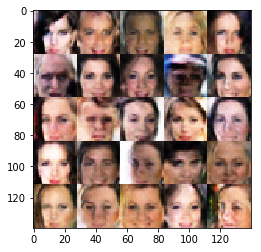

Epoch 3/5... Discriminator Loss: 0.9765... Generator Loss: 0.9479
Epoch 3/5... Discriminator Loss: 1.3469... Generator Loss: 0.5617
Epoch 3/5... Discriminator Loss: 1.0943... Generator Loss: 0.9696
Epoch 3/5... Discriminator Loss: 1.2737... Generator Loss: 1.2565
Epoch 3/5... Discriminator Loss: 1.3588... Generator Loss: 0.5811
Epoch 3/5... Discriminator Loss: 1.1807... Generator Loss: 0.9069
Epoch 3/5... Discriminator Loss: 1.2058... Generator Loss: 0.6406
Epoch 3/5... Discriminator Loss: 1.0574... Generator Loss: 0.9809
Epoch 3/5... Discriminator Loss: 1.1196... Generator Loss: 0.9048
Epoch 3/5... Discriminator Loss: 0.9987... Generator Loss: 0.8469


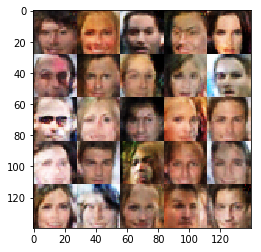

Epoch 3/5... Discriminator Loss: 1.4240... Generator Loss: 1.4349
Epoch 3/5... Discriminator Loss: 1.2019... Generator Loss: 0.8273
Epoch 3/5... Discriminator Loss: 1.1031... Generator Loss: 0.9995
Epoch 3/5... Discriminator Loss: 1.4445... Generator Loss: 1.6123
Epoch 3/5... Discriminator Loss: 1.0587... Generator Loss: 1.0481
Epoch 3/5... Discriminator Loss: 1.2326... Generator Loss: 0.9993
Epoch 3/5... Discriminator Loss: 1.1710... Generator Loss: 0.7837
Epoch 3/5... Discriminator Loss: 1.3498... Generator Loss: 1.2312
Epoch 3/5... Discriminator Loss: 1.3080... Generator Loss: 0.5892
Epoch 3/5... Discriminator Loss: 1.0797... Generator Loss: 0.9014


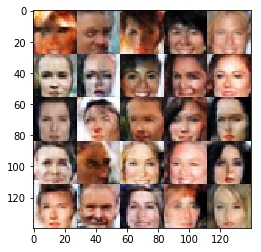

Epoch 3/5... Discriminator Loss: 1.1973... Generator Loss: 1.1645
Epoch 3/5... Discriminator Loss: 1.3513... Generator Loss: 1.0303
Epoch 3/5... Discriminator Loss: 1.0703... Generator Loss: 0.7638
Epoch 3/5... Discriminator Loss: 1.0215... Generator Loss: 0.8528
Epoch 3/5... Discriminator Loss: 1.2851... Generator Loss: 0.8870
Epoch 3/5... Discriminator Loss: 1.2685... Generator Loss: 0.6665
Epoch 3/5... Discriminator Loss: 1.1935... Generator Loss: 0.8318
Epoch 3/5... Discriminator Loss: 1.1302... Generator Loss: 0.6851
Epoch 3/5... Discriminator Loss: 1.2149... Generator Loss: 0.7316
Epoch 3/5... Discriminator Loss: 1.2248... Generator Loss: 0.9596


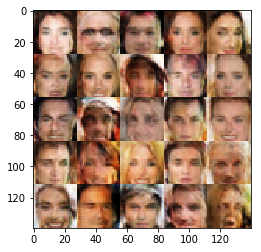

Epoch 3/5... Discriminator Loss: 1.2746... Generator Loss: 0.6793
Epoch 3/5... Discriminator Loss: 1.1624... Generator Loss: 0.7945
Epoch 3/5... Discriminator Loss: 1.2290... Generator Loss: 1.2115
Epoch 3/5... Discriminator Loss: 1.1751... Generator Loss: 0.6570
Epoch 3/5... Discriminator Loss: 1.2634... Generator Loss: 0.6971
Epoch 3/5... Discriminator Loss: 1.3266... Generator Loss: 1.0954
Epoch 3/5... Discriminator Loss: 1.1566... Generator Loss: 0.7393
Epoch 3/5... Discriminator Loss: 0.9838... Generator Loss: 0.7217
Epoch 3/5... Discriminator Loss: 1.3421... Generator Loss: 0.5378
Epoch 3/5... Discriminator Loss: 1.1791... Generator Loss: 0.8020


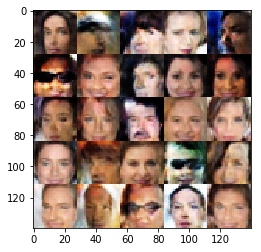

Epoch 3/5... Discriminator Loss: 1.2460... Generator Loss: 0.6773
Epoch 3/5... Discriminator Loss: 1.1179... Generator Loss: 1.0612
Epoch 3/5... Discriminator Loss: 1.2158... Generator Loss: 1.1831
Epoch 3/5... Discriminator Loss: 1.2295... Generator Loss: 0.6735
Epoch 3/5... Discriminator Loss: 1.4387... Generator Loss: 0.8096
Epoch 3/5... Discriminator Loss: 1.4662... Generator Loss: 1.5010
Epoch 3/5... Discriminator Loss: 1.3108... Generator Loss: 0.6266
Epoch 3/5... Discriminator Loss: 1.2861... Generator Loss: 0.6882
Epoch 3/5... Discriminator Loss: 1.2479... Generator Loss: 0.7633
Epoch 3/5... Discriminator Loss: 1.0642... Generator Loss: 0.7435


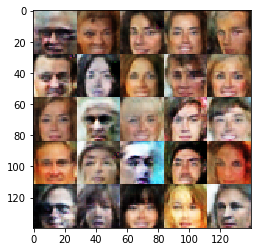

Epoch 3/5... Discriminator Loss: 1.3641... Generator Loss: 1.4283
Epoch 3/5... Discriminator Loss: 1.0703... Generator Loss: 0.9956
Epoch 3/5... Discriminator Loss: 1.3794... Generator Loss: 1.1010
Epoch 3/5... Discriminator Loss: 1.0987... Generator Loss: 0.6579
Epoch 3/5... Discriminator Loss: 1.3888... Generator Loss: 0.5164
Epoch 3/5... Discriminator Loss: 1.2303... Generator Loss: 0.7753
Epoch 3/5... Discriminator Loss: 1.1608... Generator Loss: 0.6202
Epoch 3/5... Discriminator Loss: 1.3424... Generator Loss: 0.5245
Epoch 3/5... Discriminator Loss: 1.2888... Generator Loss: 0.6407
Epoch 3/5... Discriminator Loss: 1.1199... Generator Loss: 0.9365


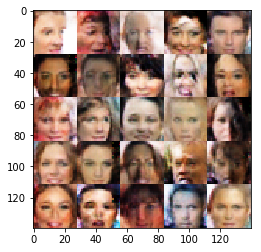

Epoch 3/5... Discriminator Loss: 1.1655... Generator Loss: 1.1957
Epoch 3/5... Discriminator Loss: 1.2200... Generator Loss: 0.7490
Epoch 3/5... Discriminator Loss: 1.0148... Generator Loss: 0.7995
Epoch 3/5... Discriminator Loss: 1.2779... Generator Loss: 0.8046
Epoch 3/5... Discriminator Loss: 1.4566... Generator Loss: 0.4455
Epoch 3/5... Discriminator Loss: 1.2686... Generator Loss: 0.8821
Epoch 3/5... Discriminator Loss: 1.3379... Generator Loss: 0.5700
Epoch 3/5... Discriminator Loss: 1.3456... Generator Loss: 1.1037
Epoch 3/5... Discriminator Loss: 1.2897... Generator Loss: 0.5425
Epoch 3/5... Discriminator Loss: 1.1336... Generator Loss: 1.0102


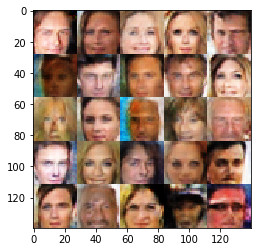

Epoch 3/5... Discriminator Loss: 1.0872... Generator Loss: 0.8183
Epoch 3/5... Discriminator Loss: 1.3237... Generator Loss: 0.8448
Epoch 3/5... Discriminator Loss: 1.2274... Generator Loss: 0.6840
Epoch 3/5... Discriminator Loss: 1.1989... Generator Loss: 0.8240
Epoch 3/5... Discriminator Loss: 1.2316... Generator Loss: 0.8231
Epoch 3/5... Discriminator Loss: 1.2498... Generator Loss: 0.5116
Epoch 3/5... Discriminator Loss: 1.2480... Generator Loss: 1.1693
Epoch 3/5... Discriminator Loss: 1.1925... Generator Loss: 0.7139
Epoch 3/5... Discriminator Loss: 1.2768... Generator Loss: 1.0820
Epoch 3/5... Discriminator Loss: 1.2674... Generator Loss: 0.6711


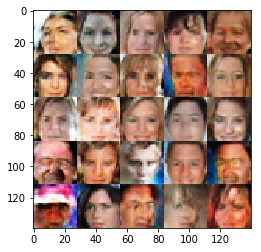

Epoch 3/5... Discriminator Loss: 1.2305... Generator Loss: 1.1731
Epoch 3/5... Discriminator Loss: 1.2795... Generator Loss: 0.7001
Epoch 3/5... Discriminator Loss: 1.3136... Generator Loss: 0.6267
Epoch 3/5... Discriminator Loss: 1.2146... Generator Loss: 0.7194
Epoch 3/5... Discriminator Loss: 1.2646... Generator Loss: 0.5272
Epoch 3/5... Discriminator Loss: 1.2600... Generator Loss: 0.5875
Epoch 3/5... Discriminator Loss: 1.3302... Generator Loss: 0.7987
Epoch 3/5... Discriminator Loss: 1.2275... Generator Loss: 0.9254
Epoch 3/5... Discriminator Loss: 1.2046... Generator Loss: 0.8047
Epoch 3/5... Discriminator Loss: 1.0680... Generator Loss: 0.9370


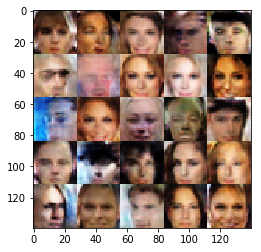

Epoch 3/5... Discriminator Loss: 1.4439... Generator Loss: 0.4203
Epoch 3/5... Discriminator Loss: 1.2115... Generator Loss: 1.2431
Epoch 3/5... Discriminator Loss: 1.3101... Generator Loss: 0.6770
Epoch 3/5... Discriminator Loss: 1.2624... Generator Loss: 0.5080
Epoch 3/5... Discriminator Loss: 1.2521... Generator Loss: 0.7881
Epoch 3/5... Discriminator Loss: 1.2606... Generator Loss: 0.6878
Epoch 3/5... Discriminator Loss: 1.3394... Generator Loss: 0.5801
Epoch 3/5... Discriminator Loss: 1.4357... Generator Loss: 1.4662
Epoch 3/5... Discriminator Loss: 1.1323... Generator Loss: 1.0694
Epoch 3/5... Discriminator Loss: 1.3406... Generator Loss: 0.7627


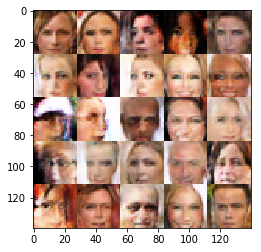

Epoch 3/5... Discriminator Loss: 1.2933... Generator Loss: 0.8185
Epoch 3/5... Discriminator Loss: 1.3122... Generator Loss: 0.6190
Epoch 3/5... Discriminator Loss: 1.1928... Generator Loss: 0.7162
Epoch 3/5... Discriminator Loss: 1.4033... Generator Loss: 0.4651
Epoch 3/5... Discriminator Loss: 1.2103... Generator Loss: 0.8215
Epoch 3/5... Discriminator Loss: 1.1494... Generator Loss: 0.8983
Epoch 3/5... Discriminator Loss: 1.2571... Generator Loss: 0.6020
Epoch 3/5... Discriminator Loss: 1.2382... Generator Loss: 0.7007
Epoch 3/5... Discriminator Loss: 1.0218... Generator Loss: 1.0081
Epoch 3/5... Discriminator Loss: 1.1912... Generator Loss: 0.8315


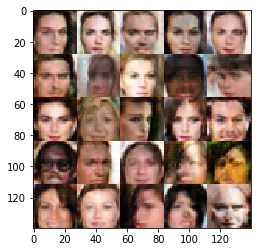

Epoch 3/5... Discriminator Loss: 1.2303... Generator Loss: 0.6446
Epoch 3/5... Discriminator Loss: 1.2411... Generator Loss: 1.2006
Epoch 3/5... Discriminator Loss: 1.1886... Generator Loss: 1.0687
Epoch 3/5... Discriminator Loss: 1.0506... Generator Loss: 0.8525
Epoch 3/5... Discriminator Loss: 1.3536... Generator Loss: 0.5913
Epoch 3/5... Discriminator Loss: 1.1168... Generator Loss: 0.8804
Epoch 3/5... Discriminator Loss: 1.4400... Generator Loss: 0.4551
Epoch 4/5... Discriminator Loss: 1.1611... Generator Loss: 0.8349
Epoch 4/5... Discriminator Loss: 1.3181... Generator Loss: 0.6610
Epoch 4/5... Discriminator Loss: 1.1601... Generator Loss: 1.0997


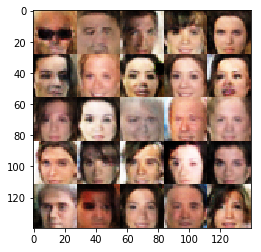

Epoch 4/5... Discriminator Loss: 1.0878... Generator Loss: 0.7376
Epoch 4/5... Discriminator Loss: 1.2576... Generator Loss: 0.5347
Epoch 4/5... Discriminator Loss: 1.3586... Generator Loss: 1.0950
Epoch 4/5... Discriminator Loss: 1.2109... Generator Loss: 0.8838
Epoch 4/5... Discriminator Loss: 1.1852... Generator Loss: 0.6529
Epoch 4/5... Discriminator Loss: 1.0785... Generator Loss: 0.8114
Epoch 4/5... Discriminator Loss: 1.2116... Generator Loss: 0.6712
Epoch 4/5... Discriminator Loss: 1.0994... Generator Loss: 0.8622
Epoch 4/5... Discriminator Loss: 1.3667... Generator Loss: 0.5583
Epoch 4/5... Discriminator Loss: 1.1978... Generator Loss: 0.7370


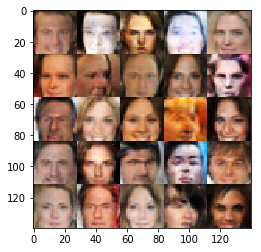

Epoch 4/5... Discriminator Loss: 1.2424... Generator Loss: 0.7592
Epoch 4/5... Discriminator Loss: 1.1327... Generator Loss: 0.7592
Epoch 4/5... Discriminator Loss: 1.3013... Generator Loss: 0.8387
Epoch 4/5... Discriminator Loss: 1.2355... Generator Loss: 1.3652
Epoch 4/5... Discriminator Loss: 1.2423... Generator Loss: 1.0413
Epoch 4/5... Discriminator Loss: 1.1595... Generator Loss: 0.7147
Epoch 4/5... Discriminator Loss: 1.4517... Generator Loss: 1.5400
Epoch 4/5... Discriminator Loss: 1.2072... Generator Loss: 0.7048
Epoch 4/5... Discriminator Loss: 1.1107... Generator Loss: 0.8740
Epoch 4/5... Discriminator Loss: 1.1494... Generator Loss: 1.0142


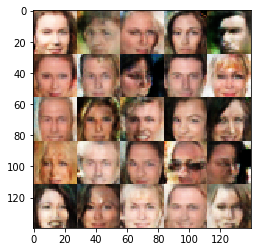

Epoch 4/5... Discriminator Loss: 1.2230... Generator Loss: 0.9683
Epoch 4/5... Discriminator Loss: 1.5298... Generator Loss: 0.7919
Epoch 4/5... Discriminator Loss: 1.3859... Generator Loss: 0.5994
Epoch 4/5... Discriminator Loss: 1.0211... Generator Loss: 0.9273
Epoch 4/5... Discriminator Loss: 1.5378... Generator Loss: 0.4098
Epoch 4/5... Discriminator Loss: 1.3501... Generator Loss: 0.6367
Epoch 4/5... Discriminator Loss: 1.7679... Generator Loss: 0.3037
Epoch 4/5... Discriminator Loss: 1.2261... Generator Loss: 0.8840
Epoch 4/5... Discriminator Loss: 1.2897... Generator Loss: 0.9811
Epoch 4/5... Discriminator Loss: 1.2735... Generator Loss: 0.5641


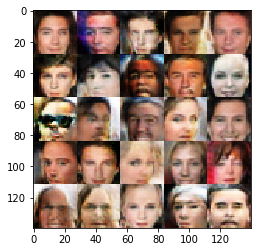

Epoch 4/5... Discriminator Loss: 1.2277... Generator Loss: 0.9110
Epoch 4/5... Discriminator Loss: 1.2026... Generator Loss: 1.0632
Epoch 4/5... Discriminator Loss: 1.1637... Generator Loss: 0.6698
Epoch 4/5... Discriminator Loss: 1.2233... Generator Loss: 0.6826
Epoch 4/5... Discriminator Loss: 1.1287... Generator Loss: 0.7932
Epoch 4/5... Discriminator Loss: 1.2813... Generator Loss: 0.7181
Epoch 4/5... Discriminator Loss: 1.0923... Generator Loss: 0.9616
Epoch 4/5... Discriminator Loss: 1.6886... Generator Loss: 0.2802
Epoch 4/5... Discriminator Loss: 1.1448... Generator Loss: 0.8581
Epoch 4/5... Discriminator Loss: 1.3199... Generator Loss: 0.7388


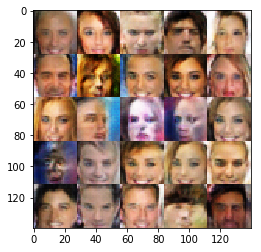

Epoch 4/5... Discriminator Loss: 1.3660... Generator Loss: 0.6526
Epoch 4/5... Discriminator Loss: 1.2578... Generator Loss: 0.7801
Epoch 4/5... Discriminator Loss: 1.0911... Generator Loss: 0.7125
Epoch 4/5... Discriminator Loss: 1.4033... Generator Loss: 1.3734
Epoch 4/5... Discriminator Loss: 1.2469... Generator Loss: 0.6918
Epoch 4/5... Discriminator Loss: 1.1643... Generator Loss: 0.5907
Epoch 4/5... Discriminator Loss: 1.2164... Generator Loss: 0.7286
Epoch 4/5... Discriminator Loss: 0.8904... Generator Loss: 0.9179
Epoch 4/5... Discriminator Loss: 1.2819... Generator Loss: 0.6998
Epoch 4/5... Discriminator Loss: 1.2408... Generator Loss: 0.6877


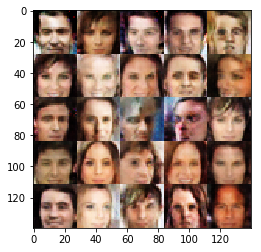

Epoch 4/5... Discriminator Loss: 1.4882... Generator Loss: 0.4250
Epoch 4/5... Discriminator Loss: 1.2612... Generator Loss: 0.7328
Epoch 4/5... Discriminator Loss: 1.1955... Generator Loss: 0.7525
Epoch 4/5... Discriminator Loss: 1.2620... Generator Loss: 0.5979
Epoch 4/5... Discriminator Loss: 1.0529... Generator Loss: 1.0736
Epoch 4/5... Discriminator Loss: 1.3515... Generator Loss: 0.8391
Epoch 4/5... Discriminator Loss: 1.1351... Generator Loss: 0.7624
Epoch 4/5... Discriminator Loss: 1.2816... Generator Loss: 0.5762
Epoch 4/5... Discriminator Loss: 1.2193... Generator Loss: 0.9667
Epoch 4/5... Discriminator Loss: 1.3030... Generator Loss: 0.9429


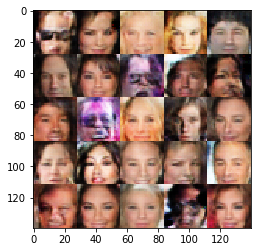

Epoch 4/5... Discriminator Loss: 1.3071... Generator Loss: 0.4693
Epoch 4/5... Discriminator Loss: 1.4098... Generator Loss: 0.5051
Epoch 4/5... Discriminator Loss: 1.3837... Generator Loss: 0.4993
Epoch 4/5... Discriminator Loss: 1.0946... Generator Loss: 0.8248
Epoch 4/5... Discriminator Loss: 1.2822... Generator Loss: 0.8598
Epoch 4/5... Discriminator Loss: 1.2819... Generator Loss: 0.5637
Epoch 4/5... Discriminator Loss: 1.2434... Generator Loss: 0.7074
Epoch 4/5... Discriminator Loss: 1.1281... Generator Loss: 0.5742
Epoch 4/5... Discriminator Loss: 1.0305... Generator Loss: 0.8542
Epoch 4/5... Discriminator Loss: 1.3758... Generator Loss: 0.8325


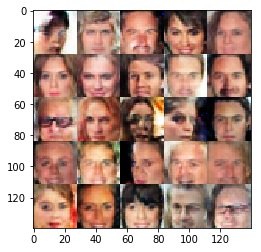

Epoch 4/5... Discriminator Loss: 1.1728... Generator Loss: 0.9621
Epoch 4/5... Discriminator Loss: 1.1654... Generator Loss: 0.7318
Epoch 4/5... Discriminator Loss: 1.3055... Generator Loss: 0.7789
Epoch 4/5... Discriminator Loss: 1.1708... Generator Loss: 0.7436
Epoch 4/5... Discriminator Loss: 1.2190... Generator Loss: 0.8852
Epoch 4/5... Discriminator Loss: 1.3949... Generator Loss: 0.5282
Epoch 4/5... Discriminator Loss: 1.2869... Generator Loss: 0.8120
Epoch 4/5... Discriminator Loss: 1.2657... Generator Loss: 0.6098
Epoch 4/5... Discriminator Loss: 1.0200... Generator Loss: 0.9288
Epoch 4/5... Discriminator Loss: 1.5677... Generator Loss: 0.3379


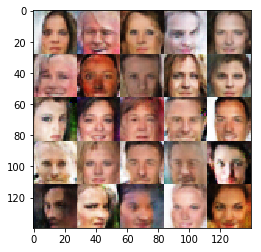

Epoch 4/5... Discriminator Loss: 1.1436... Generator Loss: 0.9939
Epoch 4/5... Discriminator Loss: 1.2642... Generator Loss: 0.8096
Epoch 4/5... Discriminator Loss: 1.0240... Generator Loss: 0.7716
Epoch 4/5... Discriminator Loss: 1.3417... Generator Loss: 0.5513
Epoch 4/5... Discriminator Loss: 1.3352... Generator Loss: 0.4620
Epoch 4/5... Discriminator Loss: 1.2685... Generator Loss: 0.8765
Epoch 4/5... Discriminator Loss: 1.4275... Generator Loss: 0.4262
Epoch 4/5... Discriminator Loss: 1.1315... Generator Loss: 1.1038
Epoch 4/5... Discriminator Loss: 1.3305... Generator Loss: 0.6758
Epoch 4/5... Discriminator Loss: 1.5385... Generator Loss: 0.3677


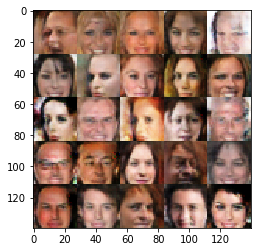

Epoch 4/5... Discriminator Loss: 1.2661... Generator Loss: 0.6552
Epoch 4/5... Discriminator Loss: 1.3638... Generator Loss: 0.5519
Epoch 4/5... Discriminator Loss: 1.2909... Generator Loss: 0.5156
Epoch 4/5... Discriminator Loss: 1.1282... Generator Loss: 1.0655
Epoch 4/5... Discriminator Loss: 1.3302... Generator Loss: 0.5840
Epoch 4/5... Discriminator Loss: 1.3597... Generator Loss: 0.6701
Epoch 4/5... Discriminator Loss: 1.1751... Generator Loss: 0.8068
Epoch 4/5... Discriminator Loss: 1.2563... Generator Loss: 0.9172
Epoch 4/5... Discriminator Loss: 1.2598... Generator Loss: 0.6503
Epoch 4/5... Discriminator Loss: 1.3559... Generator Loss: 0.8341


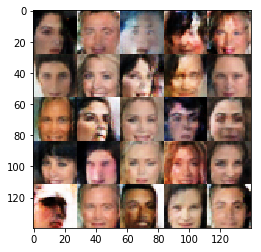

Epoch 4/5... Discriminator Loss: 1.2293... Generator Loss: 0.8772
Epoch 4/5... Discriminator Loss: 1.3499... Generator Loss: 0.4793
Epoch 4/5... Discriminator Loss: 1.3342... Generator Loss: 0.7052
Epoch 4/5... Discriminator Loss: 1.1859... Generator Loss: 1.1188
Epoch 4/5... Discriminator Loss: 1.3255... Generator Loss: 0.6073
Epoch 4/5... Discriminator Loss: 1.3495... Generator Loss: 0.4439
Epoch 4/5... Discriminator Loss: 1.3513... Generator Loss: 1.2263
Epoch 4/5... Discriminator Loss: 1.2541... Generator Loss: 0.7939
Epoch 4/5... Discriminator Loss: 1.1597... Generator Loss: 0.9492
Epoch 4/5... Discriminator Loss: 1.1696... Generator Loss: 0.7445


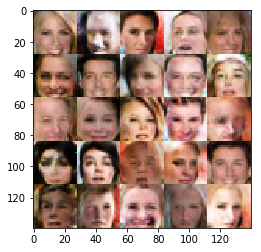

Epoch 4/5... Discriminator Loss: 1.3251... Generator Loss: 0.4819
Epoch 4/5... Discriminator Loss: 1.2135... Generator Loss: 1.0057
Epoch 4/5... Discriminator Loss: 1.2854... Generator Loss: 0.9382
Epoch 4/5... Discriminator Loss: 1.2341... Generator Loss: 0.7493
Epoch 4/5... Discriminator Loss: 1.2711... Generator Loss: 0.7062
Epoch 4/5... Discriminator Loss: 1.2534... Generator Loss: 0.7544
Epoch 4/5... Discriminator Loss: 1.3965... Generator Loss: 0.4597
Epoch 4/5... Discriminator Loss: 0.9970... Generator Loss: 1.0037
Epoch 4/5... Discriminator Loss: 1.3517... Generator Loss: 0.4702
Epoch 4/5... Discriminator Loss: 1.3365... Generator Loss: 0.8007


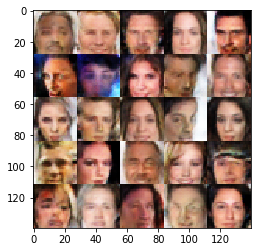

Epoch 4/5... Discriminator Loss: 1.1137... Generator Loss: 0.8697
Epoch 4/5... Discriminator Loss: 1.2996... Generator Loss: 0.5338
Epoch 4/5... Discriminator Loss: 1.4811... Generator Loss: 0.4483
Epoch 4/5... Discriminator Loss: 1.2638... Generator Loss: 0.8096
Epoch 4/5... Discriminator Loss: 1.1949... Generator Loss: 0.6172
Epoch 4/5... Discriminator Loss: 1.6435... Generator Loss: 0.2803
Epoch 4/5... Discriminator Loss: 1.1582... Generator Loss: 0.7452
Epoch 4/5... Discriminator Loss: 1.2960... Generator Loss: 0.4831
Epoch 4/5... Discriminator Loss: 1.2648... Generator Loss: 0.6637
Epoch 4/5... Discriminator Loss: 1.2317... Generator Loss: 0.7069


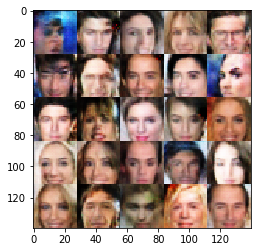

Epoch 4/5... Discriminator Loss: 1.2596... Generator Loss: 0.7029
Epoch 4/5... Discriminator Loss: 1.2066... Generator Loss: 0.5555
Epoch 4/5... Discriminator Loss: 1.2977... Generator Loss: 0.7877
Epoch 4/5... Discriminator Loss: 1.3378... Generator Loss: 0.6192
Epoch 4/5... Discriminator Loss: 1.1750... Generator Loss: 0.7620
Epoch 4/5... Discriminator Loss: 1.2352... Generator Loss: 0.6402
Epoch 4/5... Discriminator Loss: 1.1858... Generator Loss: 0.7638
Epoch 4/5... Discriminator Loss: 1.2616... Generator Loss: 0.5814
Epoch 4/5... Discriminator Loss: 1.1404... Generator Loss: 0.7283
Epoch 4/5... Discriminator Loss: 1.1807... Generator Loss: 0.8167


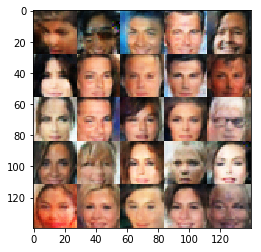

Epoch 4/5... Discriminator Loss: 1.2575... Generator Loss: 0.5840
Epoch 4/5... Discriminator Loss: 1.2174... Generator Loss: 0.6699
Epoch 4/5... Discriminator Loss: 1.2495... Generator Loss: 0.6278
Epoch 4/5... Discriminator Loss: 1.1878... Generator Loss: 0.7999
Epoch 4/5... Discriminator Loss: 1.2675... Generator Loss: 0.6198
Epoch 4/5... Discriminator Loss: 1.2194... Generator Loss: 0.6229
Epoch 4/5... Discriminator Loss: 1.5198... Generator Loss: 0.4072
Epoch 4/5... Discriminator Loss: 1.3085... Generator Loss: 0.9432
Epoch 4/5... Discriminator Loss: 1.2519... Generator Loss: 0.6368
Epoch 4/5... Discriminator Loss: 1.1496... Generator Loss: 0.8409


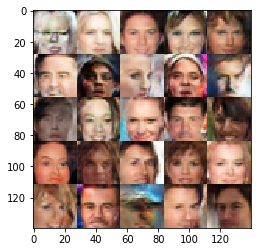

Epoch 4/5... Discriminator Loss: 1.2355... Generator Loss: 0.6996
Epoch 4/5... Discriminator Loss: 1.2571... Generator Loss: 0.5053
Epoch 4/5... Discriminator Loss: 1.2637... Generator Loss: 0.5577
Epoch 4/5... Discriminator Loss: 1.3076... Generator Loss: 0.5695
Epoch 4/5... Discriminator Loss: 1.1862... Generator Loss: 0.7784
Epoch 4/5... Discriminator Loss: 1.1646... Generator Loss: 0.7969
Epoch 4/5... Discriminator Loss: 1.1208... Generator Loss: 0.9524
Epoch 4/5... Discriminator Loss: 1.1955... Generator Loss: 0.9148
Epoch 4/5... Discriminator Loss: 1.1515... Generator Loss: 0.7925
Epoch 4/5... Discriminator Loss: 1.3970... Generator Loss: 0.4723


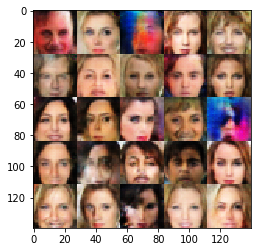

Epoch 4/5... Discriminator Loss: 1.2751... Generator Loss: 1.1377
Epoch 4/5... Discriminator Loss: 1.2411... Generator Loss: 0.5958
Epoch 4/5... Discriminator Loss: 1.1427... Generator Loss: 0.7693
Epoch 4/5... Discriminator Loss: 1.3876... Generator Loss: 1.3865
Epoch 4/5... Discriminator Loss: 1.3523... Generator Loss: 0.5063
Epoch 4/5... Discriminator Loss: 1.4308... Generator Loss: 0.4411
Epoch 4/5... Discriminator Loss: 1.3858... Generator Loss: 0.4649
Epoch 4/5... Discriminator Loss: 1.1408... Generator Loss: 0.6128
Epoch 4/5... Discriminator Loss: 1.2718... Generator Loss: 1.1017
Epoch 4/5... Discriminator Loss: 1.4804... Generator Loss: 0.3989


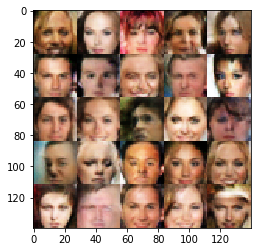

Epoch 4/5... Discriminator Loss: 1.3321... Generator Loss: 0.8053
Epoch 4/5... Discriminator Loss: 1.2544... Generator Loss: 0.6621
Epoch 4/5... Discriminator Loss: 1.2254... Generator Loss: 0.6046
Epoch 4/5... Discriminator Loss: 1.2843... Generator Loss: 0.9153
Epoch 4/5... Discriminator Loss: 1.3227... Generator Loss: 0.7421
Epoch 4/5... Discriminator Loss: 1.3123... Generator Loss: 0.9395
Epoch 4/5... Discriminator Loss: 1.1731... Generator Loss: 0.8171
Epoch 4/5... Discriminator Loss: 1.3283... Generator Loss: 0.5843
Epoch 4/5... Discriminator Loss: 0.8068... Generator Loss: 1.1120
Epoch 4/5... Discriminator Loss: 1.2884... Generator Loss: 0.7514


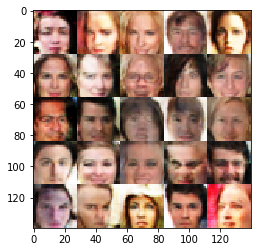

Epoch 4/5... Discriminator Loss: 1.1654... Generator Loss: 0.7832
Epoch 4/5... Discriminator Loss: 1.1301... Generator Loss: 0.8249
Epoch 4/5... Discriminator Loss: 1.2999... Generator Loss: 0.5353
Epoch 4/5... Discriminator Loss: 1.4152... Generator Loss: 0.5226
Epoch 4/5... Discriminator Loss: 1.3064... Generator Loss: 1.7494
Epoch 4/5... Discriminator Loss: 1.1415... Generator Loss: 0.8166
Epoch 4/5... Discriminator Loss: 1.2233... Generator Loss: 0.7499
Epoch 4/5... Discriminator Loss: 1.2229... Generator Loss: 0.6777
Epoch 4/5... Discriminator Loss: 1.3236... Generator Loss: 0.7571
Epoch 4/5... Discriminator Loss: 1.2759... Generator Loss: 0.8328


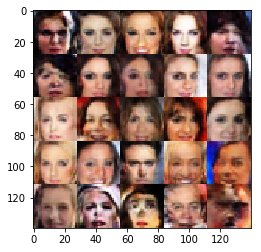

Epoch 4/5... Discriminator Loss: 1.2903... Generator Loss: 0.5955
Epoch 4/5... Discriminator Loss: 1.2436... Generator Loss: 0.7841
Epoch 4/5... Discriminator Loss: 1.2121... Generator Loss: 0.6513
Epoch 4/5... Discriminator Loss: 1.2899... Generator Loss: 0.4537
Epoch 4/5... Discriminator Loss: 1.3619... Generator Loss: 1.3846
Epoch 4/5... Discriminator Loss: 1.2244... Generator Loss: 0.8425
Epoch 4/5... Discriminator Loss: 1.4438... Generator Loss: 0.5952
Epoch 4/5... Discriminator Loss: 1.1577... Generator Loss: 0.7275
Epoch 4/5... Discriminator Loss: 1.2439... Generator Loss: 0.6945
Epoch 4/5... Discriminator Loss: 1.1253... Generator Loss: 0.6596


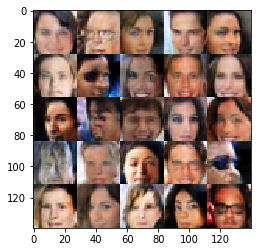

Epoch 5/5... Discriminator Loss: 1.4213... Generator Loss: 0.8615
Epoch 5/5... Discriminator Loss: 1.2335... Generator Loss: 0.6282
Epoch 5/5... Discriminator Loss: 1.2393... Generator Loss: 0.8794
Epoch 5/5... Discriminator Loss: 1.1795... Generator Loss: 0.8629
Epoch 5/5... Discriminator Loss: 1.3217... Generator Loss: 0.7312
Epoch 5/5... Discriminator Loss: 1.3218... Generator Loss: 0.5208
Epoch 5/5... Discriminator Loss: 1.3832... Generator Loss: 0.4442
Epoch 5/5... Discriminator Loss: 1.3136... Generator Loss: 0.6059
Epoch 5/5... Discriminator Loss: 1.1811... Generator Loss: 0.6180
Epoch 5/5... Discriminator Loss: 1.1432... Generator Loss: 0.7307


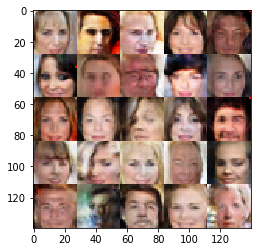

Epoch 5/5... Discriminator Loss: 1.1311... Generator Loss: 1.0062
Epoch 5/5... Discriminator Loss: 1.4681... Generator Loss: 1.4923
Epoch 5/5... Discriminator Loss: 1.1828... Generator Loss: 0.8984
Epoch 5/5... Discriminator Loss: 1.2063... Generator Loss: 0.5267
Epoch 5/5... Discriminator Loss: 1.1885... Generator Loss: 0.9510
Epoch 5/5... Discriminator Loss: 1.2665... Generator Loss: 0.5670
Epoch 5/5... Discriminator Loss: 1.1071... Generator Loss: 0.7759
Epoch 5/5... Discriminator Loss: 1.2346... Generator Loss: 1.0459
Epoch 5/5... Discriminator Loss: 1.3345... Generator Loss: 0.6230
Epoch 5/5... Discriminator Loss: 0.8487... Generator Loss: 1.0591


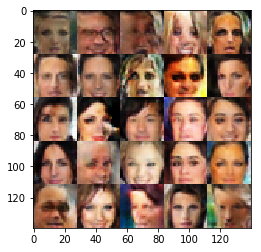

Epoch 5/5... Discriminator Loss: 1.1267... Generator Loss: 0.9282
Epoch 5/5... Discriminator Loss: 1.1829... Generator Loss: 0.8645
Epoch 5/5... Discriminator Loss: 1.2402... Generator Loss: 0.6309
Epoch 5/5... Discriminator Loss: 1.2451... Generator Loss: 0.7930
Epoch 5/5... Discriminator Loss: 1.3384... Generator Loss: 0.8427
Epoch 5/5... Discriminator Loss: 1.2805... Generator Loss: 0.8305
Epoch 5/5... Discriminator Loss: 1.4160... Generator Loss: 0.4954
Epoch 5/5... Discriminator Loss: 1.2962... Generator Loss: 1.5039
Epoch 5/5... Discriminator Loss: 1.2356... Generator Loss: 1.0128
Epoch 5/5... Discriminator Loss: 1.1758... Generator Loss: 0.6239


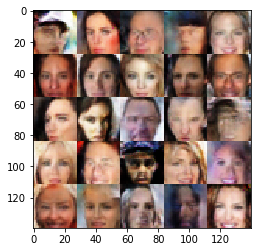

Epoch 5/5... Discriminator Loss: 0.9216... Generator Loss: 1.2190
Epoch 5/5... Discriminator Loss: 1.0491... Generator Loss: 1.1000
Epoch 5/5... Discriminator Loss: 1.5868... Generator Loss: 1.5510
Epoch 5/5... Discriminator Loss: 1.1411... Generator Loss: 0.9021
Epoch 5/5... Discriminator Loss: 1.5237... Generator Loss: 0.6987
Epoch 5/5... Discriminator Loss: 1.2343... Generator Loss: 0.7632
Epoch 5/5... Discriminator Loss: 1.2343... Generator Loss: 0.7018
Epoch 5/5... Discriminator Loss: 1.4229... Generator Loss: 1.2684
Epoch 5/5... Discriminator Loss: 1.6440... Generator Loss: 0.3418
Epoch 5/5... Discriminator Loss: 1.5360... Generator Loss: 0.4410


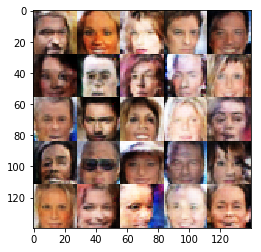

Epoch 5/5... Discriminator Loss: 1.2160... Generator Loss: 0.7964
Epoch 5/5... Discriminator Loss: 1.4460... Generator Loss: 0.5444
Epoch 5/5... Discriminator Loss: 1.1252... Generator Loss: 0.6039
Epoch 5/5... Discriminator Loss: 1.1854... Generator Loss: 0.8325
Epoch 5/5... Discriminator Loss: 1.1234... Generator Loss: 0.8557
Epoch 5/5... Discriminator Loss: 1.2007... Generator Loss: 0.7241
Epoch 5/5... Discriminator Loss: 1.3849... Generator Loss: 0.8038
Epoch 5/5... Discriminator Loss: 1.3171... Generator Loss: 0.5565
Epoch 5/5... Discriminator Loss: 1.3147... Generator Loss: 0.6762
Epoch 5/5... Discriminator Loss: 1.3516... Generator Loss: 0.6918


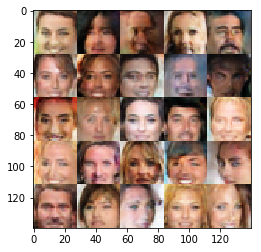

Epoch 5/5... Discriminator Loss: 1.4373... Generator Loss: 0.4905
Epoch 5/5... Discriminator Loss: 1.2854... Generator Loss: 0.9865
Epoch 5/5... Discriminator Loss: 1.2377... Generator Loss: 0.7956
Epoch 5/5... Discriminator Loss: 1.4441... Generator Loss: 1.1125
Epoch 5/5... Discriminator Loss: 1.2280... Generator Loss: 0.7450
Epoch 5/5... Discriminator Loss: 1.2382... Generator Loss: 0.7572
Epoch 5/5... Discriminator Loss: 1.2250... Generator Loss: 0.6973
Epoch 5/5... Discriminator Loss: 1.0667... Generator Loss: 0.9176
Epoch 5/5... Discriminator Loss: 1.1833... Generator Loss: 0.7443
Epoch 5/5... Discriminator Loss: 1.2366... Generator Loss: 0.6531


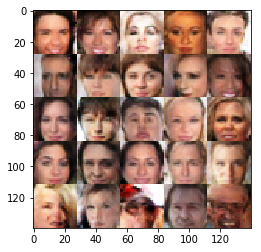

Epoch 5/5... Discriminator Loss: 1.4297... Generator Loss: 0.6591
Epoch 5/5... Discriminator Loss: 1.2599... Generator Loss: 0.8671
Epoch 5/5... Discriminator Loss: 1.3157... Generator Loss: 0.5965
Epoch 5/5... Discriminator Loss: 1.3376... Generator Loss: 0.6975
Epoch 5/5... Discriminator Loss: 1.2859... Generator Loss: 1.2227
Epoch 5/5... Discriminator Loss: 1.2640... Generator Loss: 0.8071
Epoch 5/5... Discriminator Loss: 1.1922... Generator Loss: 0.8479
Epoch 5/5... Discriminator Loss: 1.0106... Generator Loss: 0.8890
Epoch 5/5... Discriminator Loss: 1.2488... Generator Loss: 0.6753
Epoch 5/5... Discriminator Loss: 1.1907... Generator Loss: 0.7047


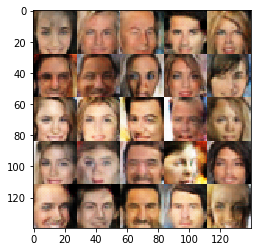

Epoch 5/5... Discriminator Loss: 1.1980... Generator Loss: 0.6039
Epoch 5/5... Discriminator Loss: 1.2377... Generator Loss: 0.6636
Epoch 5/5... Discriminator Loss: 1.2991... Generator Loss: 0.5503
Epoch 5/5... Discriminator Loss: 1.2242... Generator Loss: 0.6950
Epoch 5/5... Discriminator Loss: 1.2155... Generator Loss: 0.7690
Epoch 5/5... Discriminator Loss: 1.2460... Generator Loss: 0.6788
Epoch 5/5... Discriminator Loss: 1.2293... Generator Loss: 1.3406
Epoch 5/5... Discriminator Loss: 1.4266... Generator Loss: 0.5685
Epoch 5/5... Discriminator Loss: 1.2701... Generator Loss: 0.6113
Epoch 5/5... Discriminator Loss: 1.0940... Generator Loss: 0.8288


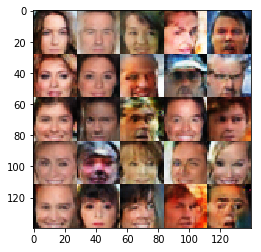

Epoch 5/5... Discriminator Loss: 1.2444... Generator Loss: 0.8643
Epoch 5/5... Discriminator Loss: 1.2511... Generator Loss: 0.8767
Epoch 5/5... Discriminator Loss: 0.9629... Generator Loss: 0.8314
Epoch 5/5... Discriminator Loss: 1.1577... Generator Loss: 1.0684
Epoch 5/5... Discriminator Loss: 1.2112... Generator Loss: 0.6606
Epoch 5/5... Discriminator Loss: 1.2580... Generator Loss: 0.8144
Epoch 5/5... Discriminator Loss: 1.3383... Generator Loss: 1.2555
Epoch 5/5... Discriminator Loss: 1.2595... Generator Loss: 0.7637
Epoch 5/5... Discriminator Loss: 1.1507... Generator Loss: 0.8184
Epoch 5/5... Discriminator Loss: 1.3127... Generator Loss: 0.6037


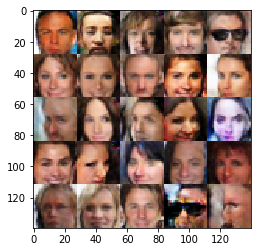

Epoch 5/5... Discriminator Loss: 1.1915... Generator Loss: 0.8838
Epoch 5/5... Discriminator Loss: 1.1254... Generator Loss: 0.7240
Epoch 5/5... Discriminator Loss: 1.3200... Generator Loss: 0.5761
Epoch 5/5... Discriminator Loss: 1.1737... Generator Loss: 0.7375
Epoch 5/5... Discriminator Loss: 1.1918... Generator Loss: 0.6855
Epoch 5/5... Discriminator Loss: 1.2351... Generator Loss: 0.8429
Epoch 5/5... Discriminator Loss: 1.3141... Generator Loss: 0.6464
Epoch 5/5... Discriminator Loss: 1.2549... Generator Loss: 0.8818
Epoch 5/5... Discriminator Loss: 1.2322... Generator Loss: 1.1090
Epoch 5/5... Discriminator Loss: 1.3229... Generator Loss: 0.6588


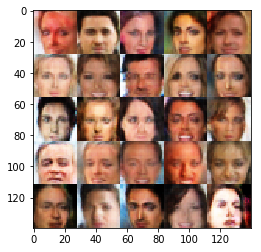

Epoch 5/5... Discriminator Loss: 1.2579... Generator Loss: 0.9064
Epoch 5/5... Discriminator Loss: 1.3186... Generator Loss: 0.7499
Epoch 5/5... Discriminator Loss: 1.3073... Generator Loss: 0.9125
Epoch 5/5... Discriminator Loss: 1.2368... Generator Loss: 0.5574
Epoch 5/5... Discriminator Loss: 1.2852... Generator Loss: 0.7469
Epoch 5/5... Discriminator Loss: 1.5310... Generator Loss: 1.3362
Epoch 5/5... Discriminator Loss: 1.2277... Generator Loss: 0.7222
Epoch 5/5... Discriminator Loss: 1.3163... Generator Loss: 0.6800
Epoch 5/5... Discriminator Loss: 1.3542... Generator Loss: 0.6809
Epoch 5/5... Discriminator Loss: 1.3353... Generator Loss: 0.5152


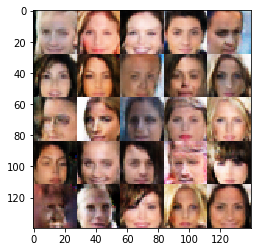

Epoch 5/5... Discriminator Loss: 1.1501... Generator Loss: 0.9894
Epoch 5/5... Discriminator Loss: 1.1767... Generator Loss: 0.7904
Epoch 5/5... Discriminator Loss: 1.2133... Generator Loss: 0.7247
Epoch 5/5... Discriminator Loss: 1.2012... Generator Loss: 0.8628
Epoch 5/5... Discriminator Loss: 1.1438... Generator Loss: 0.7923
Epoch 5/5... Discriminator Loss: 1.3617... Generator Loss: 0.5714
Epoch 5/5... Discriminator Loss: 1.1262... Generator Loss: 0.6205
Epoch 5/5... Discriminator Loss: 1.4685... Generator Loss: 0.4410
Epoch 5/5... Discriminator Loss: 1.1040... Generator Loss: 0.5663
Epoch 5/5... Discriminator Loss: 1.3122... Generator Loss: 1.3213


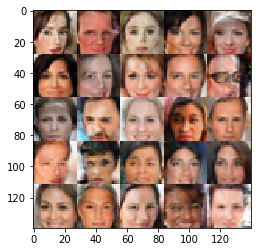

Epoch 5/5... Discriminator Loss: 1.2476... Generator Loss: 0.4608
Epoch 5/5... Discriminator Loss: 1.3111... Generator Loss: 0.5699
Epoch 5/5... Discriminator Loss: 1.1709... Generator Loss: 0.6036
Epoch 5/5... Discriminator Loss: 1.2977... Generator Loss: 0.5881
Epoch 5/5... Discriminator Loss: 1.2265... Generator Loss: 0.6534
Epoch 5/5... Discriminator Loss: 1.3759... Generator Loss: 0.7026
Epoch 5/5... Discriminator Loss: 1.0859... Generator Loss: 1.0199
Epoch 5/5... Discriminator Loss: 1.2977... Generator Loss: 0.5879
Epoch 5/5... Discriminator Loss: 1.3975... Generator Loss: 0.5531
Epoch 5/5... Discriminator Loss: 1.2052... Generator Loss: 0.8797


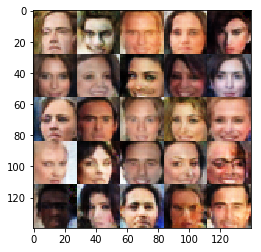

Epoch 5/5... Discriminator Loss: 1.3417... Generator Loss: 0.6227
Epoch 5/5... Discriminator Loss: 1.3580... Generator Loss: 0.4834
Epoch 5/5... Discriminator Loss: 1.1745... Generator Loss: 0.6394
Epoch 5/5... Discriminator Loss: 1.2136... Generator Loss: 0.8742
Epoch 5/5... Discriminator Loss: 1.2765... Generator Loss: 0.6533
Epoch 5/5... Discriminator Loss: 1.2984... Generator Loss: 0.8192
Epoch 5/5... Discriminator Loss: 1.2080... Generator Loss: 0.7841
Epoch 5/5... Discriminator Loss: 1.3697... Generator Loss: 1.4569
Epoch 5/5... Discriminator Loss: 1.2967... Generator Loss: 0.6722
Epoch 5/5... Discriminator Loss: 1.2490... Generator Loss: 0.7116


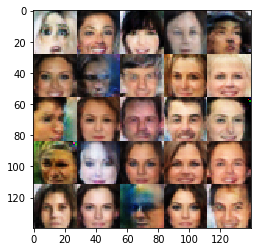

Epoch 5/5... Discriminator Loss: 1.3184... Generator Loss: 0.5593
Epoch 5/5... Discriminator Loss: 1.0526... Generator Loss: 0.8172
Epoch 5/5... Discriminator Loss: 1.5089... Generator Loss: 1.1825
Epoch 5/5... Discriminator Loss: 1.3421... Generator Loss: 0.7980
Epoch 5/5... Discriminator Loss: 1.3082... Generator Loss: 0.7972
Epoch 5/5... Discriminator Loss: 1.2459... Generator Loss: 0.8179
Epoch 5/5... Discriminator Loss: 1.2160... Generator Loss: 0.6363
Epoch 5/5... Discriminator Loss: 1.2301... Generator Loss: 0.6936
Epoch 5/5... Discriminator Loss: 1.2501... Generator Loss: 0.9196
Epoch 5/5... Discriminator Loss: 1.1142... Generator Loss: 0.7588


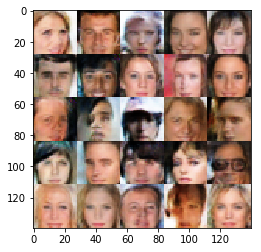

Epoch 5/5... Discriminator Loss: 1.2558... Generator Loss: 0.6692
Epoch 5/5... Discriminator Loss: 1.1913... Generator Loss: 0.6351
Epoch 5/5... Discriminator Loss: 1.3604... Generator Loss: 0.5712
Epoch 5/5... Discriminator Loss: 1.2288... Generator Loss: 0.5814
Epoch 5/5... Discriminator Loss: 1.4891... Generator Loss: 0.3540
Epoch 5/5... Discriminator Loss: 1.3260... Generator Loss: 1.4655
Epoch 5/5... Discriminator Loss: 1.1629... Generator Loss: 0.8044
Epoch 5/5... Discriminator Loss: 1.1873... Generator Loss: 0.8045
Epoch 5/5... Discriminator Loss: 1.2365... Generator Loss: 0.7893
Epoch 5/5... Discriminator Loss: 1.2133... Generator Loss: 0.6716


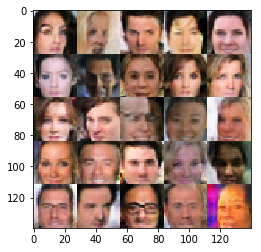

Epoch 5/5... Discriminator Loss: 1.2468... Generator Loss: 0.6874
Epoch 5/5... Discriminator Loss: 1.1368... Generator Loss: 0.7515
Epoch 5/5... Discriminator Loss: 1.4085... Generator Loss: 1.3875
Epoch 5/5... Discriminator Loss: 1.2692... Generator Loss: 0.7674
Epoch 5/5... Discriminator Loss: 1.0618... Generator Loss: 0.9610
Epoch 5/5... Discriminator Loss: 1.3952... Generator Loss: 0.7987
Epoch 5/5... Discriminator Loss: 1.4174... Generator Loss: 0.6070
Epoch 5/5... Discriminator Loss: 1.2033... Generator Loss: 0.7215
Epoch 5/5... Discriminator Loss: 1.2488... Generator Loss: 0.6288
Epoch 5/5... Discriminator Loss: 1.1258... Generator Loss: 0.8200


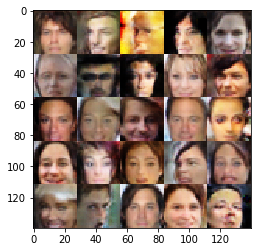

Epoch 5/5... Discriminator Loss: 1.7107... Generator Loss: 0.2748
Epoch 5/5... Discriminator Loss: 1.1712... Generator Loss: 0.7228
Epoch 5/5... Discriminator Loss: 1.2630... Generator Loss: 0.7618
Epoch 5/5... Discriminator Loss: 1.1094... Generator Loss: 0.9813
Epoch 5/5... Discriminator Loss: 1.1754... Generator Loss: 0.8600
Epoch 5/5... Discriminator Loss: 1.2456... Generator Loss: 0.9206
Epoch 5/5... Discriminator Loss: 1.2893... Generator Loss: 1.1228
Epoch 5/5... Discriminator Loss: 1.1754... Generator Loss: 1.2533
Epoch 5/5... Discriminator Loss: 1.2264... Generator Loss: 0.8295
Epoch 5/5... Discriminator Loss: 1.1415... Generator Loss: 1.0107


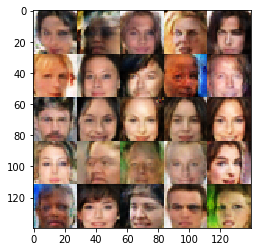

Epoch 5/5... Discriminator Loss: 1.2554... Generator Loss: 0.7927
Epoch 5/5... Discriminator Loss: 1.3504... Generator Loss: 0.5998
Epoch 5/5... Discriminator Loss: 1.3032... Generator Loss: 0.6133
Epoch 5/5... Discriminator Loss: 1.2292... Generator Loss: 0.5638
Epoch 5/5... Discriminator Loss: 1.3174... Generator Loss: 0.6972
Epoch 5/5... Discriminator Loss: 1.2525... Generator Loss: 0.6533
Epoch 5/5... Discriminator Loss: 1.3280... Generator Loss: 0.6127
Epoch 5/5... Discriminator Loss: 1.2688... Generator Loss: 0.6593
Epoch 5/5... Discriminator Loss: 1.2637... Generator Loss: 0.6630
Epoch 5/5... Discriminator Loss: 1.2342... Generator Loss: 1.1116


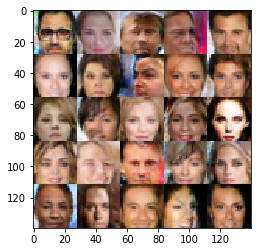

Epoch 5/5... Discriminator Loss: 1.2489... Generator Loss: 1.1755
Epoch 5/5... Discriminator Loss: 1.2921... Generator Loss: 0.5007
Epoch 5/5... Discriminator Loss: 1.3006... Generator Loss: 0.8145
Epoch 5/5... Discriminator Loss: 1.7167... Generator Loss: 1.0084
Epoch 5/5... Discriminator Loss: 1.3828... Generator Loss: 0.4727
Epoch 5/5... Discriminator Loss: 1.2474... Generator Loss: 0.7921
Epoch 5/5... Discriminator Loss: 1.1170... Generator Loss: 0.8334
Epoch 5/5... Discriminator Loss: 1.4748... Generator Loss: 0.5937
Epoch 5/5... Discriminator Loss: 1.1620... Generator Loss: 0.7966
Epoch 5/5... Discriminator Loss: 1.2915... Generator Loss: 0.8013


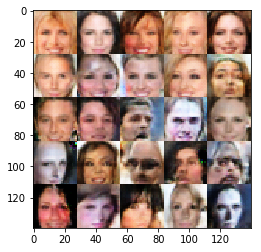

Epoch 5/5... Discriminator Loss: 1.3507... Generator Loss: 0.6120
Epoch 5/5... Discriminator Loss: 1.4241... Generator Loss: 0.5033


In [24]:
batch_size = 100
z_dim = 60
learning_rate = 0.0006
beta1 = 0.4

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 5

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)